In [1]:
# TODO
# Transfer some of the functions to a .utils doc?
# Clip altimetry datasets to grounding line

# Setup computing environment

In [1]:
%pip install openpyxl

  Using cached openpyxl-3.1.2-py2.py3-none-any.whl (249 kB)
  Using cached et_xmlfile-1.1.0-py3-none-any.whl (4.7 kB)
Note: you may need to restart the kernel to use updated packages.


# Setup computing environment

In [2]:
# Code to plot established active subglacial lakes and locate lake candidates
# using folium interactive plotting
#
# Written 2023-01-17 by W. Sauthoff (sauthoff@mines.edu)

# Import packages
import datetime
# import folium
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as colors
from matplotlib.legend_handler import HandlerTuple
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import os
from pyproj import CRS, Transformer
import rioxarray
from skimage import measure

# define data and script directories dependent on home environment
if os.getenv('HOME') == '/home/jovyan':
    DATA_DIR = '/home/jovyan/data'
    OUTPUT_DIR = '/home/jovyan/1_outlines_candidates/output/lake_candidates'
    SCRIPT_DIR = '/home/jovyan/repos_my/script_dir'
elif os.getenv('HOME') == '/Users/Wilson': 
    DATA_DIR = '/Volumes/ExtremeSSD/data'
    SCRIPT_DIR = '/Users/Wilson/Documents/0-code/repos_my/script_dir'

# Define constants and coordinate transforms for the geodesic area calculation
CRS_LL = "EPSG:4326" # wgs84 in lon,lat
GEOD = CRS(CRS_LL).get_geod() # geod object for calculating geodesic area on defined ellipsoid
CRS_XY = "EPSG:3031" # Antarctic Polar Stereographic in x, y
XY_TO_LL = Transformer.from_crs(CRS_XY, CRS_LL, always_xy = True) # make coord transformer

# Define utility functions
def datetime2fracyear(date):
    start = datetime.date(date.year, 1, 1).toordinal()
    year_length = datetime.date(date.year+1, 1, 1).toordinal() - start
    return date.year + float(date.toordinal() - start) / year_length

def ll2ps(lon, lat):
    """
    Transform coordinates from geodetic coordinates (lon, lat)
    to Antarctic Polar Stereographic coordinates (x, y)
    x, y = ll2ps(lon, lat)
    """
    crs_ll = CRS("EPSG:4326")
    crs_xy = CRS("EPSG:3031")
    ll_to_xy = Transformer.from_crs(crs_ll, crs_xy, always_xy = True)
    x, y = ll_to_xy.transform(lon, lat)
    return x, y

def ps2ll(x, y):
    """
    Transform coordinates from Antarctic Polar Stereographic
    to geodetic (lon, lat) coordinates
    
    lon, lat = ps2ll(x, y)
    """
    crs_ll = CRS("EPSG:4326")
    crs_xy = CRS("EPSG:3031")
    xy_to_ll = Transformer.from_crs(crs_xy, crs_ll, always_xy = True)
    lon, lat = xy_to_ll.transform(x, y)
    return lon, lat

In [3]:
# Testing functionality of IS2View

In [4]:
# # Try using IS2view
# import IS2view

In [5]:
# ids,urls = IS2view.utilities.cmr(product='ATL15', release='003',
#     regions='AA', resolutions='01km', verbose=False)
# urls

In [6]:
# # Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# # https://doi.org/10.5067/ATLAS/ATL15.002
# if os.getenv('HOME') == '/home/jovyan':
#     # FIXME: temporary workaround  
#     # TODO: Grab ATL15 data using earthaccess or icepyx
#     os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
#     granules = [#'s3://is2view/ATLAS/ATL15/003/2019/ATL15_A1_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A2_0318_01km_003_02.nc',
#         's3://is2view/ATLAS/ATL15/003/2019/ATL15_A3_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A4_0318_01km_003_03.nc'
#                ]
#     ATL15_dh_A3 = IS2view.io.open_dataset(granules, group='delta_h', engine='h5netcdf')

In [7]:
# IS2view version on CryoCloud is older so it doesn't have the function I want to use
# IS2view.__version__
# https://is2view.readthedocs.io/en/latest/release_notes/release-v0.0.5.html

In [8]:
# I'll just copy the underlying io.py code for now
# https://github.com/tsutterley/IS2view/blob/main/IS2view/io.py
# feat: add delayed reads with dask for multi-granule
"""
io.py
Written by Tyler Sutterley (08/2023)
Utilities for reading gridded ICESat-2 files using rasterio and xarray

PYTHON DEPENDENCIES:
    h5netcdf: Pythonic interface to netCDF4 via h5py
        https://h5netcdf.org/
    numpy: Scientific Computing Tools For Python
        https://numpy.org
        https://numpy.org/doc/stable/user/numpy-for-matlab-users.html
    rasterio: Access to geospatial raster data
        https://github.com/rasterio/rasterio
        https://rasterio.readthedocs.io
    rioxarray: geospatial xarray extension powered by rasterio
        https://github.com/corteva/rioxarray
    xarray: N-D labeled arrays and datasets in Python
        https://docs.xarray.dev/en/stable/

UPDATE HISTORY:
    Updated 08/2023: use xarray h5netcdf to read files streaming from s3
        add open_dataset function for opening multiple granules
        add merging of datasets in preparation for Release-3 data
    Updated 07/2023: use logging instead of warnings for import attempts
    Written 11/2022
"""
from __future__ import annotations
import os
import logging

# attempt imports
try:
    import rioxarray
    import rioxarray.merge
except (AttributeError, ImportError, ModuleNotFoundError) as exc:
    logging.critical("rioxarray not available")
try:
    import dask
except (AttributeError, ImportError, ModuleNotFoundError) as exc:
    logging.critical("dask not available")
try:
    import xarray as xr
except (AttributeError, ImportError, ModuleNotFoundError) as exc:
    logging.critical("xarray not available")

# set environmental variable for anonymous s3 access
os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'

# default engine for xarray
_default_engine = dict(nc='h5netcdf', zarr='zarr')

def open_dataset(granule,
        group: str | None = None,
        format: str = 'nc',
        parallel: bool = True,
        **kwargs
    ):
    """
    Reads and optionally merges gridded ICESat-2 files

    Parameters
    ----------
    granule: str or list
        presigned url or path for granule(s) as a s3fs object
    group: str or NoneType, default None
        Data group to read
    format: str, default 'nc'
        Data format to read
    kwargs: dict
        Keyword arguments to pass to ``xarray`` reader

    Returns
    -------
    ds: object
        ``xarray`` dataset
    """
    # check if merging multiple granules
    if isinstance(granule, list):
        # merge multiple granules
        datasets = []
        closers = []
        if parallel:
            opener = dask.delayed(from_file)
            getattrs = dask.delayed(getattr)
        else:
            opener = from_file
            getattrs = getattr
        # read each granule and append to list
        for g in granule:
            datasets.append(opener(g,
                group=group,
                format=format,
                **kwargs)
            )
        closers = [getattrs(ds, "_close") for ds in datasets]
        # read datasets as dask arrays
        if parallel:
            datasets, closers = dask.compute(datasets, closers)
        # merge datasets
        ds = rioxarray.merge.merge_datasets(datasets)
    else:
        # read a single granule
        ds = from_file(granule,
            group=group,
            format=format,
            **kwargs
        )
    # return the dataset
    return ds

def from_file(granule,
        group: str | None = None,
        format: str = 'nc',
        **kwargs
    ):
    """
    Reads a gridded ICESat-2 file using ``rioxarray`` or ``xarray``

    Parameters
    ----------
    granule: str
        presigned url or path for granule
    group: str or NoneType, default None
        Data group to read
    format: str, default 'nc'
        Data format to read
    kwargs: dict
        Keyword arguments to pass to ``xarray`` reader

    Returns
    -------
    ds: object
        ``xarray`` dataset
    """
    # set default engine
    kwargs.setdefault('engine', _default_engine[format])
    if isinstance(granule, str) and format in ('nc',):
        ds = from_rasterio(granule,
            group=group,
            **kwargs
        )
    else:
        # read a single granule
        ds = from_xarray(granule,
            group=group,
            **kwargs
        )
    # return the dataset
    return ds

def from_rasterio(granule,
        group: str | None = None,
        **kwargs
    ):
    """
    Reads a gridded ICESat-2 file using ``rioxarray``

    Parameters
    ----------
    granule: str
        presigned url or path for granule
    group: str or NoneType, default None
        Data group to read
    kwargs: dict
        Keyword arguments to pass to ``rioxarray``

    Returns
    -------
    ds: object
        ``xarray`` dataset
    """
    ds = rioxarray.open_rasterio(granule,
        group=group,
        masked=True,
        **kwargs
    )
    return ds

def from_xarray(granule,
        group: str | None = None,
        engine: str = 'h5netcdf',
        **kwargs
    ):
    """
    Reads a gridded ICESat-2 file using ``xarray``

    Parameters
    ----------
    granule: str
        presigned url or path for granule
    group: str or NoneType, default None
        Data group to read
    engine: str, default 'h5netcdf'
        Engine to use when reading files
    kwargs: dict
        Keyword arguments to pass to ``xarray``

    Returns
    -------
    ds: object
        ``xarray`` dataset
    """
    kwargs.setdefault('variable', [])
    variable = kwargs.pop('variable')
    # read xarray dataset
    ds = xr.open_dataset(granule,
        group=group,
        engine=engine,
        chunks='auto',
        decode_cf=True,
        mask_and_scale=True,
        decode_times=False,
        concat_characters=True,
        decode_coords=True,
        overwrite_encoded_chunks=False,
        **kwargs
    )
    # set the coordinate reference system
    ds.rio.write_crs(ds.Polar_Stereographic.attrs['crs_wkt'], inplace=True)
    # reduce xarray dataset to specific variables
    if any(variable):
        ds = ds[variable]
    # flip orientation of y dimension
    ds = ds.isel(y=slice(None, None, -1))
    return ds

# Import datasets

In [9]:
CS2_dh = xr.open_dataset(DATA_DIR + '/altimetry/CryoSat2/CS2_SARIn_Smith2017method/mos_2010.5_2021.5.nc')
CS2_dh

<xarray.Dataset>
Dimensions:      (y: 4451, x: 5451, time: 45)
Coordinates:
  * y            (y) float64 2.265e+06 2.264e+06 ... -2.184e+06 -2.185e+06
  * x            (x) float64 -2.665e+06 -2.664e+06 ... 2.784e+06 2.785e+06
  * time         (time) float64 2.01e+03 2.011e+03 ... 2.021e+03 2.022e+03
Data variables:
    mask         (y, x) float64 ...
    delta_h      (time, y, x) float64 ...
    count        (time, y, x) float64 ...
    spatial_ref  int64 ...
Attributes:
    fileName:                mos_2010.5_2021.5.h5
    shortName:               CS2-Smith-2017
    identifier_product_DOI:  doi:10.5194/tc-11-451-2017

In [10]:
# # Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# # https://doi.org/10.5067/ATLAS/ATL15.002
# if os.getenv('HOME') == '/home/jovyan':
#     # FIXME: temporary workaround  
#     # TODO: Grab ATL15 data using earthaccess or icepyx
#     os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
#     granules = ['s3://is2view/ATLAS/ATL15/003/2019/ATL15_A1_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A2_0318_01km_003_02.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A3_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A4_0318_01km_003_03.nc'
#                ]
#     ATL15_dh_A1 = open_dataset(granules, group='delta_h', engine='h5netcdf')

In [11]:
# ATL15_dh_A1

In [12]:
# # Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# # https://doi.org/10.5067/ATLAS/ATL15.002
# if os.getenv('HOME') == '/home/jovyan':
#     # FIXME: temporary workaround  
#     # TODO: Grab ATL15 data using earthaccess or icepyx
#     os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
#     granules = [#'s3://is2view/ATLAS/ATL15/003/2019/ATL15_A1_0318_01km_003_01.nc',
#         's3://is2view/ATLAS/ATL15/003/2019/ATL15_A2_0318_01km_003_02.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A3_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A4_0318_01km_003_03.nc'
#                ]
#     ATL15_dh_A2 = open_dataset(granules, group='delta_h', engine='h5netcdf')

In [13]:
# ATL15_dh_A2

In [14]:
# # Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# # https://doi.org/10.5067/ATLAS/ATL15.002
# if os.getenv('HOME') == '/home/jovyan':
#     # FIXME: temporary workaround  
#     # TODO: Grab ATL15 data using earthaccess or icepyx
#     os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
#     granules = [#'s3://is2view/ATLAS/ATL15/003/2019/ATL15_A1_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A2_0318_01km_003_02.nc',
#         's3://is2view/ATLAS/ATL15/003/2019/ATL15_A3_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A4_0318_01km_003_03.nc'
#                ]
#     ATL15_dh_A3 = open_dataset(granules, group='delta_h', engine='h5netcdf')

In [15]:
# ATL15_dh_A3

In [16]:
# # Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# # https://doi.org/10.5067/ATLAS/ATL15.002
# if os.getenv('HOME') == '/home/jovyan':
#     # FIXME: temporary workaround  
#     # TODO: Grab ATL15 data using earthaccess or icepyx
#     os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
#     granules = [#'s3://is2view/ATLAS/ATL15/003/2019/ATL15_A1_0318_01km_003_01.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A2_0318_01km_003_02.nc',
#         # 's3://is2view/ATLAS/ATL15/003/2019/ATL15_A3_0318_01km_003_01.nc',
#         's3://is2view/ATLAS/ATL15/003/2019/ATL15_A4_0318_01km_003_03.nc'
#                ]
#     ATL15_dh_A4 = open_dataset(granules, group='delta_h', engine='h5netcdf')

In [17]:
# ATL15_dh_A4

In [18]:
# Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# https://doi.org/10.5067/ATLAS/ATL15.002
if os.getenv('HOME') == '/home/jovyan':
    # FIXME: temporary workaround  
    # TODO: Grab ATL15 data using earthaccess or icepyx
    os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
    granules = ['s3://is2view/ATLAS/ATL15/003/2019/ATL15_A1_0318_01km_003_01.nc',
        's3://is2view/ATLAS/ATL15/003/2019/ATL15_A2_0318_01km_003_02.nc',
        's3://is2view/ATLAS/ATL15/003/2019/ATL15_A3_0318_01km_003_01.nc',
        's3://is2view/ATLAS/ATL15/003/2019/ATL15_A4_0318_01km_003_03.nc']
    ATL15_dh = open_dataset(granules, group='delta_h', engine='h5netcdf')

/srv/conda/envs/notebook/lib/python3.10/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore


In [19]:
# # Try using NSIDC s3 url's; Access denied error

# # Import ICESat-2 ATL15 Gridded Antarctic and Arctic Land Ice Height Change data product 
# # https://doi.org/10.5067/ATLAS/ATL15.002
# if os.getenv('HOME') == '/home/jovyan':
#     # FIXME: temporary workaround
#     # TODO: Grab ATL15 data using earthaccess or icepyx
#     os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
#     granules = ['s3://nsidc-cumulus-prod-protected/ATLAS/ATL15/003/ATL15_A3_0318_01km_003_01.nc',
#         's3://nsidc-cumulus-prod-protected/ATLAS/ATL15/003/ATL15_A2_0318_01km_003_01.nc',
#         's3://nsidc-cumulus-prod-protected/ATLAS/ATL15/003/ATL15_A4_0318_01km_003_01.nc',
#         's3://nsidc-cumulus-prod-protected/ATLAS/ATL15/003/ATL15_A1_0318_01km_003_01.nc']
#     ATL15_dh = open_dataset(granules, group='delta_h', engine='h5netcdf')

In [ ]:
# Try Earthdata to find datasets
import earthaccess

# Try to authenticate
auth = earthaccess.login()
print(auth.authenticated)

In [ ]:
# Using a known short name
datasets = earthaccess.search_datasets(short_name="ATL15",
                                       cloud_hosted=True)
for dataset in datasets:
    pprint(dataset.summary())
    pprint(dataset.abstract())

In [ ]:
# Using a keyword search

from pprint import pprint
datasets = earthaccess.search_datasets(keyword="ATL15",
                                       cloud_hosted=True)

for dataset in datasets[0:2]:
    pprint(dataset.summary())

In [ ]:
# Using a specific concept-id, which is unique to the specific product and version

# bbox for ~Iceland is -22.1649, 63.3052, -11.9366, 65.5970 
granules_query = earthaccess.granule_query().cloud_hosted(True) \
        .concept_id("C2021957295-LPCLOUD") \
        .bounding_box(-22.1649, 63.3052, -11.9366, 65.5970) \
        .temporal("2020-01-01","2023-01-01")
granules_query.params

In [ ]:
granules_query.hits()

In [ ]:
granule = granules_query.get(1)[0]
granule.data_links()

In [19]:
# Preview data set
# Currently avoiding since it seems like it reads whole dataset into memory
ATL15_dh

<xarray.Dataset>
Dimensions:              (time: 19, x: 5461, y: 4461)
Coordinates:
    Polar_Stereographic  int64 0
  * time                 (time) float64 273.9 365.2 ... 1.826e+03 1.918e+03
  * x                    (x) float64 -2.67e+06 -2.669e+06 ... 2.789e+06 2.79e+06
  * y                    (y) float64 2.27e+06 2.269e+06 ... -2.189e+06 -2.19e+06
    spatial_ref          int64 0
Data variables:
    ice_area             (time, y, x) float32 nan nan nan nan ... nan nan nan
    delta_h              (time, y, x) float32 nan nan nan nan ... nan nan nan
    delta_h_sigma        (time, y, x) float32 nan nan nan nan ... nan nan nan
    data_count           (time, y, x) float32 nan nan nan nan ... nan nan nan
    misfit_rms           (time, y, x) float32 nan nan nan nan ... nan nan nan
    misfit_scaled_rms    (time, y, x) float32 nan nan nan nan ... nan nan nan
Attributes: (12/115)
    description:                        This data set (ATL15) contains season...
    identifier:                         SET_BY_PGE
    pulse_rate:                         10000 pps
    type:                               SET_BY_META
    wavelength:                         532 nm
    Description:                        Describe the group
    ...                                 ...
    summary:                            SET_BY_META
    time_coverage_duration:             127860207.4976883
    time_coverage_end:                  2023-04-16T20:43:31.497688Z
    time_coverage_start:                2019-03-29T00:00:04.000000Z
    time_type:                          CCSDS UTC-A
    vertical_datum:                     WGS84

In [20]:
# Try dropping data variables to consume less memory

# Specify the variable to keep
variables_to_keep = ['time', 'y', 'x', 'delta_h']

# Drop all variables except the specified ones
variables_to_drop = [var for var in ATL15_dh.variables if var not in variables_to_keep]
ATL15_dh = ATL15_dh.drop_vars(variables_to_drop)

# Preview data set
ATL15_dh

<xarray.Dataset>
Dimensions:  (time: 19, x: 5461, y: 4461)
Coordinates:
  * time     (time) float64 273.9 365.2 456.6 ... 1.735e+03 1.826e+03 1.918e+03
  * x        (x) float64 -2.67e+06 -2.669e+06 -2.668e+06 ... 2.789e+06 2.79e+06
  * y        (y) float64 2.27e+06 2.269e+06 2.268e+06 ... -2.189e+06 -2.19e+06
Data variables:
    delta_h  (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/115)
    description:                        This data set (ATL15) contains season...
    identifier:                         SET_BY_PGE
    pulse_rate:                         10000 pps
    type:                               SET_BY_META
    wavelength:                         532 nm
    Description:                        Describe the group
    ...                                 ...
    summary:                            SET_BY_META
    time_coverage_duration:             127860207.4976883
    time_coverage_end:                  2023-04-16T20:43:31.497688Z
    time_coverage_start:                2019-03-29T00:00:04.000000Z
    time_type:                          CCSDS UTC-A
    vertical_datum:                     WGS84

In [21]:
# Import MODIS MOA 2014 coastline and grounding line for plotting inset maps
# https://nsidc.org/data/nsidc-0730/versions/1
shp = DATA_DIR + '/boundaries/MODIS_MOA/2014/moa2014_coastline_v01.shp' 
moa_2014_coastline = gpd.read_file(shp)
shp = DATA_DIR + '/boundaries/MODIS_MOA/2014/moa2014_grounding_line_v01.shp' 
moa_2014_groundingline = gpd.read_file(shp)

In [22]:
# Scripps Grounding Line
# https://doi.pangaea.de/10.1594/PANGAEA.819147
Scripps_gl = gpd.read_file(DATA_DIR + 
    '/boundaries/Depoorter2013/Antarctica_masks/scripps_antarctica_polygons_v1.shp')
# Display geopandas geodataframe
Scripps_gl
# Isolate only land ice
Scripps_landice = Scripps_gl[Scripps_gl['Id_text'] == 'Grounded ice or land']

In [23]:
# CS2_dh

In [24]:
# ATL15_dh_A3

In [25]:
# # Clip altimetry datasets to Scripps Grounding Line (Depoorter and others, 2013)
# # to ignore ice shelves
# # Clipping this dataset is killing kernel; wait for now
# CS2_dh.rio.write_crs("epsg:3031", inplace=True)
# CS2_dh = CS2_dh.rio.clip(Scripps_landice.geometry.values, Scripps_landice.crs)

In [26]:
# ATL15_dh_A3 = ATL15_dh_A3.rio.clip(Scripps_landice.geometry.values, Scripps_landice.crs)

In [27]:
# Clipping ATL15_dh increases memory by 5 gb; WTF?
ATL15_dh.rio.write_crs("epsg:3031", inplace=True)
ATL15_dh = ATL15_dh.rio.clip(Scripps_landice.geometry.values, Scripps_landice.crs)

In [28]:
# CS2_dh

In [29]:
# ATL15_dh_A3

In [30]:
# MEaSUREs Antarctic Boundaries for IPY 2007-2009 from Satellite Radar V002
# https://doi.org/10.5067/AXE4121732AD
# https://nsidc.org/sites/default/files/nsidc-0709-v002-userguide.pdf
IMBIE_basins = gpd.read_file(DATA_DIR + '/boundaries/measures_Antarctic_boundaries/Basins_IMBIE_Antarctica_v02.shp')
# refined_basins = gpd.read_file(DATA_DIR + '/boundaries/measures_Antarctic_boundaries/Basins_Antarctica_v02.shp')
# ice_boundaries = gpd.read_file(DATA_DIR + '/boundaries/measures_Antarctic_boundaries/IceBoundaries_Antarctica_v02.shp')
# grounded_ice_boundaries = ice_boundaries[ice_boundaries["TYPE"]=='GR']

In [31]:
# Import subglacial lake outlines 
exec(open(SCRIPT_DIR + '/Sauthoff2023_outlines.py').read())

# Functions

The following functions enable a workflow to define region of interest, find evolving contours of delta height, plot results, refine those results to manually remove signal that is likely not related to subglacial lake activity, and export the evolving outlines and delta area time series.
* func for finding bbox coords for region of interest
* func to make directories to store output of latter func's
* func for contouring creating plots for each differenced time slice including saving plots and a gdf of the evolving outlines
* func to plot evolving outlines in aggregate
* func to remove non-overlapping outlines
* func to remove non-overlapping outlines within temporal window

In [25]:
def find_bbox_coords(ROI, buffer):
    '''
    Func to find the bounding box coordinates of a region of interest
    
    Inputs
    * ROI: Region of interest in form of 
    1) a lake name from Sauthoff and others, 2024 inventory (Sauthoff2024_outlines),
    2) IMBIE basin or refinded basins, 
    3) x and y values of a single point of interest, 
    4) or list of x_min, x_max, y_min, y_max bbox coords
    * buffer: horizontal distance in meters that will be added to each edge of the ROI to include in the bbox
    
    Outputs:
    * x_min, x_max, y_min, y_max bbox coords
    '''
    if Sauthoff2023_outlines['name'].str.contains(ROI).any():
        # Isolate individual lake using gpd buffer
        lake_gpd = Sauthoff2023_outlines.loc[Sauthoff2023_outlines['name'] == ROI]  
        lake_gpd
        lake_buffer = lake_gpd.buffer(buffer)
        # Define lake bounding box
        x_min = lake_buffer.bounds.values[0,0]; x_max = lake_buffer.bounds.values[0,2]
        y_min = lake_buffer.bounds.values[0,1]; y_max = lake_buffer.bounds.values[0,3]
     
    elif IMBIE_basins['NAME'].str.contains(ROI).any():
        # Isolate individual basin as geodf
        basin = IMBIE_basins[IMBIE_basins['NAME'] == ROI]

        # Define region bounding box
        x_min = basin.geometry.bounds.minx.values[0]; x_max = basin.geometry.bounds.maxx.values[0]
        y_min = basin.geometry.bounds.miny.values[0]; y_max = basin.geometry.bounds.maxy.values[0]
        
    elif len(ROI)==2:
        x_min = ROI[0]-buffer; x_max = ROI[0]+buffer
        y_min = ROI[1]-buffer; y_max = ROI[1]+buffer     
    
    elif len(ROI)==4: 
        x_min = ROI[0]; x_max = ROI[1]
        y_min = ROI[2]; y_max = ROI[3]
        
    return x_min, x_max, y_min, y_max

# Example usage
# x_min, x_max, y_min, y_max = find_bbox_coords(IMBIE_basins[IMBIE_basins['NAME'] == 'Ep-F'], 10000)

In [26]:
def create_dirs(folder_names, base_directory='.'):
    '''
    Make appropriate directories if they don't already exist and
    
    Inputs
    * folder names as list
    * base directory to put new folders
    
    Outputs
    * makes directories if they don't already exist
    '''
    for folder_name in folder_names:
        folder_path = os.path.join(base_directory, folder_name)

        try:
            os.makedirs(folder_path)
            print(f"Folder '{folder_name}' created at '{folder_path}'")
        except FileExistsError:
            print(f"Folder '{folder_name}' already exists at '{folder_path}'")

# # Example usage:
# folder_list = ['Folder1', 'Folder2', 'Folder3']
# create_dirs(folder_list)

In [27]:
def create_ROI_dirs(base_directory='.'):
    '''
    Make appropriate directories if they don't already exist and
    
    Inputs
    * base directory to put new folders
    
    Outputs
    * makes directories if they don't already exist
    '''
    for i in Sauthoff2023_outlines['name']:
        folder_name = str(i)
        folder_path = base_directory + '/' + folder_name

        try:
            os.makedirs(folder_path)
            print(f"Folder '{folder_name}' created at '{folder_path}'")
        except FileExistsError:
            print(f"Folder '{folder_name}' already exists at '{folder_path}'")
            
    # IMBIE basins
            
# Example usage
# make_ROI_dirs(base_directory='.')

In [32]:
def find_cumsums(dataset): 
    '''
    
    '''
    # Calculate differences 
    dataset['dh'] = dataset['delta_h'].diff(dim='time')
    
    # Initialize min/max cumulative sum lists
    min_cumsums = []
    max_cumsums = []

    # Calculate cumulative differences and update min/max
    for i in range(0, len(dataset['dh'])):
        cumsum = dataset['dh'][i:,:,:].cumsum(dim='time')
        min_cumsum = cumsum.min(dim='time', keep_attrs=True)
        min_cumsums.append(min_cumsum)
        max_cumsum = cumsum.max(dim='time', keep_attrs=True)
        max_cumsums.append(max_cumsum)

    min_cumsums_da = xr.concat(min_cumsums, dim='time')
    max_cumsums_da = xr.concat(max_cumsums, dim='time')

    grand_min_cumsum = min_cumsums_da.min(dim='time', keep_attrs=True)
    grand_max_cumsum = max_cumsums_da.max(dim='time', keep_attrs=True)

    # Create a new variable with min/max cumulative differences
    dataset['dh_grand_cumsum'] = xr.concat([grand_min_cumsum, grand_max_cumsum], dim='dh_grand_cumsum')

In [33]:
def find_candidates(dataset, threshold): 
    '''
    
    '''
    
    # Find x, y min, max
    x_min, x_max = (dataset['x'].min().values, dataset['x'].max().values)
    y_min, y_max = (dataset['y'].min().values, dataset['y'].max().values)

    x_conv = (x_max-x_min)/dataset['dh_grand_cumsum'][0,:,:].shape[1]
    y_conv = (y_max-y_min)/dataset['dh_grand_cumsum'][0,:,:].shape[0]

    # Create contours around min/max grand cumulative sums above a threshold
    contours_neg = measure.find_contours(dataset['dh_grand_cumsum'][0,:,:].values, -threshold)
    contours_pos = measure.find_contours(dataset['dh_grand_cumsum'][1,:,:].values, threshold)

    # Create empty list to store polygons, areas, perimeters and dates
    polys = []
    areas = []
    perims = []
    min_or_max = []

    # Visualize the min grand cumulative sums 
    fig, ax = plt.subplots(figsize=(20,20))
    img = ax.imshow(dataset['dh_grand_cumsum'][0,:,:], 
                    extent=[x_min, x_max, y_min, y_max], origin='upper',
                    norm=colors.CenteredNorm(), cmap='RdBu')

    # Plot the contours
    for i in range(len(contours_neg)):
        x = x_min+contours_neg[i][:,1]*x_conv
        y = y_max-contours_neg[i][:,0]*y_conv
        ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
                linewidth=1, label=-threshold)
        
        # Make polygons from evolving outlines and store to list
        if len(contours_neg[i][:,1]) > 2: 
            poly = Polygon(list(zip(x, y))) 
            polys += [poly]

            # Calc polygon area and perimeter and store to lists
            lon, lat = XY_TO_LL.transform(x,y)
            poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])/1e6
            poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])/1e3
            areas += [poly_area]
            perims += [poly_perim]
            min_or_max += ['min']

    # Overlay published active lake outlines for visual comparison and grounding line
    Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

    # Label axes set limits
    ax.set_xlabel('x [km]', size=25)
    ax.set_ylabel('y [km]', size=25)
    x_min, x_max = (dataset['x'].min().values-10e3, dataset['x'].max().values+10e3)
    y_min, y_max = (dataset['y'].min().values-10e3, dataset['y'].max().values+10e3)
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Add colorbar and title
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    fig.colorbar(img, cax=cax).set_label('minimum cumulative sum\nheight change [m]', size=15)
    ax.set_title('minimum cumulative sum dh with {} m threshold contours'.format(threshold), size=15)

    # Save and close fig
    plt.savefig(OUTPUT_DIR + 
        '/find_candidates/find_candidates_min_cumsum_{}_{}m-threshold.png'
        .format(str(dataset.granule_type), threshold), dpi=300, bbox_inches='tight')
    plt.close()
    
    # Visualize the max grand cumulative sums 
    fig, ax = plt.subplots(figsize=(20,20))
    img = ax.imshow(dataset['dh_grand_cumsum'][1,:,:], 
                    extent=[x_min, x_max, y_min, y_max], origin='upper',
                    norm=colors.CenteredNorm(), cmap='RdBu')

    # Plot the contours
    for i in range(len(contours_pos)):
        x = x_min+contours_pos[i][:,1]*x_conv
        y = y_max-contours_pos[i][:,0]*y_conv
        ax.plot(x, y, color='mediumblue', linestyle='dashdot', 
                linewidth=1, label=threshold)
        
        # Make polygons from evolving outlines and store to list
        if len(contours_pos[i][:,1]) > 2: 
            poly = Polygon(list(zip(x, y))) 
            polys += [poly]

            # Calc polygon area and perimeter and store to lists
            lon, lat = XY_TO_LL.transform(x,y)
            poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])/1e6
            poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])/1e3
            areas += [poly_area]
            perims += [poly_perim]
            min_or_max += ['max']

    # Overlay published active lake outlines for visual comparison and grounding line
    Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

    # Label axes set limits
    ax.set_xlabel('x [km]', size=25)
    ax.set_ylabel('y [km]', size=25)
    x_min, x_max = (dataset['x'].min().values-10e3, dataset['x'].max().values+10e3)
    y_min, y_max = (dataset['y'].min().values-10e3, dataset['y'].max().values+10e3)
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Add colorbar and title
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    fig.colorbar(img, cax=cax).set_label('maximum cumulative sum\nheight change [m]', size=15)
    ax.set_title('maximum cumulative sum dh with {} m threshold contours'.format(threshold), size=15)
    
    # Save and close fig
    plt.savefig(OUTPUT_DIR + 
        '/find_candidates/find_candidates_max_cumsum_{}_{}m-threshold.png'
        .format(str(dataset.granule_type), threshold), dpi=300, bbox_inches='tight')
    plt.close()   

    # Store polygons in geopandas geodataframe for further analysis
    data = {'geometry': polys, 'area (km^2)': areas, 'perim (km)': perims, 'min_or_max': min_or_max}
    gdf = gpd.GeoDataFrame(data, crs="EPSG:3031")
    gdf['centroid'] = gdf['geometry'].centroid

    return gdf

# # Example usage
# gdf = find_candidates(ATL15_dh, 1)

In [34]:
# # change to just make gdf of oulines?
# def find_candidates(dataset, threshold): 
#     '''
    
#     '''
    
#     # Find x, y min, max
#     x_min, x_max = (dataset['x'].min().values, dataset['x'].max().values)
#     y_min, y_max = (dataset['y'].min().values, dataset['y'].max().values)

#     x_conv = (x_max-x_min)/dataset['dh_grand_cumsum'][0,:,:].shape[1]
#     y_conv = (y_max-y_min)/dataset['dh_grand_cumsum'][0,:,:].shape[0]

#     # Create contours around min/max grand cumulative sums above a threshold
#     contours_neg = measure.find_contours(dataset['dh_grand_cumsum'][0,:,:].values, -threshold)
#     contours_pos = measure.find_contours(dataset['dh_grand_cumsum'][1,:,:].values, threshold)

#     # Create empty list to store polygons, areas, perimeters and dates
#     polys = []
#     areas = []
#     perims = []
#     min_or_max = []

#     # Visualize the min grand cumulative sums 
#     fig, ax = plt.subplots(figsize=(20,20))
#     img = ax.imshow(dataset['dh_grand_cumsum'][0,:,:], 
#                     extent=[x_min, x_max, y_min, y_max], origin='upper',
#                     norm=colors.CenteredNorm(), cmap='RdBu')

#     # Plot the contours
#     for i in range(len(contours_neg)):
#         x = x_min+contours_neg[i][:,1]*x_conv
#         y = y_max-contours_neg[i][:,0]*y_conv
#         ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
#                 linewidth=1, label=-threshold)
        
#         # Make polygons from evolving outlines and store to list
#         if len(contours_neg[i][:,1]) > 2: 
#             poly = Polygon(list(zip(x, y))) 
#             polys += [poly]

#             # Calc polygon area and perimeter and store to lists
#             lon, lat = XY_TO_LL.transform(x,y)
#             poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])/1e6
#             poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])/1e3
#             areas += [poly_area]
#             perims += [poly_perim]
#             min_or_max += ['min']

#     # Overlay published active lake outlines for visual comparison and grounding line
#     Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
#     SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
#     Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
#     Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

#     # Label axes set limits
#     ax.set_xlabel('x [km]', size=25)
#     ax.set_ylabel('y [km]', size=25)
#     x_min, x_max = (dataset['x'].min().values-10e3, dataset['x'].max().values+10e3)
#     y_min, y_max = (dataset['y'].min().values-10e3, dataset['y'].max().values+10e3)
#     ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

#     # Add colorbar and title
#     divider = make_axes_locatable(ax)
#     cax = divider.append_axes('right', size='5%', pad=0.2)
#     fig.colorbar(img, cax=cax).set_label('minimum cumulative sum\nheight change [m]', size=15)
#     ax.set_title('minimum cumulative sum dh with {} m threshold contours'.format(threshold), size=15)

#     # Save and close fig
#     plt.savefig(OUTPUT_DIR + 
#         '/find_candidates/find_candidates_min_cumsum_{}_{}m-threshold.png'
#         .format(str(dataset.granule_type), threshold), dpi=300, bbox_inches='tight')
#     plt.close()
    
#     # Visualize the max grand cumulative sums 
#     fig, ax = plt.subplots(figsize=(20,20))
#     img = ax.imshow(dataset['dh_grand_cumsum'][1,:,:], 
#                     extent=[x_min, x_max, y_min, y_max], origin='upper',
#                     norm=colors.CenteredNorm(), cmap='RdBu')

#     # Plot the contours
#     for i in range(len(contours_pos)):
#         x = x_min+contours_pos[i][:,1]*x_conv
#         y = y_max-contours_pos[i][:,0]*y_conv
#         ax.plot(x, y, color='mediumblue', linestyle='dashdot', 
#                 linewidth=1, label=threshold)
        
#         # Make polygons from evolving outlines and store to list
#         if len(contours_pos[i][:,1]) > 2: 
#             poly = Polygon(list(zip(x, y))) 
#             polys += [poly]

#             # Calc polygon area and perimeter and store to lists
#             lon, lat = XY_TO_LL.transform(x,y)
#             poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])/1e6
#             poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])/1e3
#             areas += [poly_area]
#             perims += [poly_perim]
#             min_or_max += ['max']

#     # Overlay published active lake outlines for visual comparison and grounding line
#     Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
#     SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
#     Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
#     Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

#     # Label axes set limits
#     ax.set_xlabel('x [km]', size=25)
#     ax.set_ylabel('y [km]', size=25)
#     x_min, x_max = (dataset['x'].min().values-10e3, dataset['x'].max().values+10e3)
#     y_min, y_max = (dataset['y'].min().values-10e3, dataset['y'].max().values+10e3)
#     ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

#     # Add colorbar and title
#     divider = make_axes_locatable(ax)
#     cax = divider.append_axes('right', size='5%', pad=0.2)
#     fig.colorbar(img, cax=cax).set_label('maximum cumulative sum\nheight change [m]', size=15)
#     ax.set_title('maximum cumulative sum dh with {} m threshold contours'.format(threshold), size=15)
    
#     # Save and close fig
#     plt.savefig(OUTPUT_DIR + 
#         '/find_candidates/find_candidates_max_cumsum_{}_{}m-threshold.png'
#         .format(str(dataset.granule_type), threshold), dpi=300, bbox_inches='tight')
#     plt.close()   

#     # Store polygons in geopandas geodataframe for further analysis
#     data = {'geometry': polys, 'area (km^2)': areas, 'perim (km)': perims, 'min_or_max': min_or_max}
#     gdf = gpd.GeoDataFrame(data, crs="EPSG:3031")
#     gdf['centroid'] = gdf['geometry'].centroid

#     return gdf

# # # Example usage
# # gdf = find_candidates(ATL15_dh, 1)

In [34]:
def plot_candidates(ROI, dataset, threshold, gdf):
    '''
    
    '''
    # Find x, y min, max
    x_min, x_max = (dataset['x'].min().values, dataset['x'].max().values)
    y_min, y_max = (dataset['y'].min().values, dataset['y'].max().values)
    
    # Visualize the max grand cumulative sums 
    fig, ax = plt.subplots(figsize=(20,20))
    
    # Plot the outlines
    if 'min_or_max' in gdf.columns:
        gdf[gdf['min_or_max'] == 'min'].boundary.plot(ax=ax, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
                linewidth=1, label='min cumsum dh {} m contour'.format(threshold))
        gdf[gdf['min_or_max'] == 'max'].boundary.plot(ax=ax, color='mediumblue', linestyle='dashdot', 
                linewidth=1, label='max cumsum dh {} m contour'.format(threshold))
    else:
        gdf.boundary.plot(ax=ax, color='magenta', linestyle='solid', 
        linewidth=1, label='lake candidates')
    
    # Overlay published active lake outlines for visual comparison and grounding line
    Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

    # Label axes set limits
    ax.set_xlabel('x [km]', size=25)
    ax.set_ylabel('y [km]', size=25)
    x_min, x_max = (dataset['x'].min().values-30e3, dataset['x'].max().values+30e3)
    y_min, y_max = (dataset['y'].min().values-30e3, dataset['y'].max().values+30e3)
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Add legend and title
    ax.legend()
    ax.set_title('min/max cumulative sum dh created {} m threshold contours'.format(threshold), size=15)
    
    # Save and close fig
    plt.savefig(OUTPUT_DIR + 
        '/plot_candidates/{}/plot_candidates_{}_{}_{}m-threshold.png'
        .format(ROI, ROI, gdf.metadata['name'], threshold), dpi=300, bbox_inches='tight')
    plt.close()

In [28]:
def find_evolving_outlines(ROI, x_min, x_max, y_min, y_max, threshold, buffer, dataset1, dataset2): 
    '''
    Create planview dh/dt plots of ice surface height changes 
    Create time-variable outlines using skimage contour to plot evolving outlines as polygons.
    
    Inputs: 
    * x_min, x_max, y_min, y_max: polar stereographic coords
    * threshold: vertical distance in meters to delineate ice surface deformation contour
    * dataset1: dataset1 to be analyzed
    * dataset2: dataset2 to be analyzed in conjunction with dataset1; currently configured to 
    splice CryoSat-2 and ICESat-2 eras
    
    Outputs: 
    * Sequence of planview delta height visuals of ICESat-2 ATL15 with variable ice surface 
    deformation contours plotted to delineate evolving lake boundaries.
    * geopandas geodataframe of polygons created at each step (would need to modify to collect all polygons 
    at all time steps)
    '''

    # Subset CryoSat-2 SARIn data set to region of interest
    mask_x = (dataset1.x >= x_min) & (dataset1.x <= x_max)
    mask_y = (dataset1.y >= y_min) & (dataset1.y <= y_max)
    ds1_clipped = dataset1.where(mask_x & mask_y, drop=True)
    
    # Subset ATL15 data set to region of interest
    mask_x = (dataset2.x >= x_min) & (dataset2.x <= x_max)
    mask_y = (dataset2.y >= y_min) & (dataset2.y <= y_max)
    ds2_clipped = dataset2.where(mask_x & mask_y, drop=True)

    # Create lines for legend
    uplift = plt.Line2D((0, 1), (0, 0), color='mediumblue', linestyle='dashdot', linewidth=2)
    subsidence = plt.Line2D((0, 1), (0, 0), color='maroon', linestyle=(0, (3, 1, 1, 1)), linewidth=2)

    # Find start, end, and mid-cycle dates of combined CryoSat-2 and ICESat-2 data
    cyc_start_dates = []
    cyc_end_dates = []
    midcyc_dates = []
    for idx in range(len(dataset1.delta_h[:33])):
        # Smith and others, 2017 method CryoSat-2 SARIn data
        if dataset1.identifier_product_DOI == 'doi:10.5194/tc-11-451-2017':
            cyc_start_date = datetime.datetime(int(dataset1.time.values[idx]), 1, 1) + datetime.timedelta(days = (dataset1.time.values[idx] % 1) * 365.25)
            cyc_end_date = datetime.datetime(int(dataset1.time.values[idx+1]), 1, 1) + datetime.timedelta(days = (dataset1.time.values[idx+1] % 1) * 365.25)
            midcyc_days = cyc_end_date - cyc_start_date
            midcyc_date = cyc_start_date + midcyc_days/2
            cyc_start_dates += [cyc_start_date]
            cyc_end_dates += [cyc_end_date]
            midcyc_dates += [midcyc_date]
        # Cryo-TEMPO-EOLIS Swath Thematic Gridded Product 
        elif dataset1.Title == 'Land Ice Elevation Thematic Gridded Product':
            date_time_str = '70-01-01'
            date_time_obj = datetime.datetime.strptime(date_time_str, '%y-%m-%d')
            cyc_start_date = date_time_obj + datetime.timedelta(seconds = ds_sub.time.values[idx].astype(float))
            cyc_end_date = date_time_obj + datetime.timedelta(seconds = ds_sub.time.values[idx+1].astype(float))
            midcyc_days = cyc_end_date - cyc_start_date
            midcyc_date = cyc_start_date + midcyc_days/2
            cyc_start_dates += [cyc_start_date]
            cyc_end_dates += [cyc_end_date]
            midcyc_dates += [midcyc_date]
    for idx in range(len(dataset2.delta_h)-1): 
        # ICESat-2 ATL15 r003
        if dataset2.identifier_product_DOI == 'NOT_SET':    
            date_time_str = '18-01-01'
            date_time_obj = datetime.datetime.strptime(date_time_str, '%y-%m-%d')
            cyc_start_date = date_time_obj + datetime.timedelta(days=dataset2.time.values[idx])
            cyc_end_date = date_time_obj + datetime.timedelta(days=dataset2.time.values[idx+1])
            midcyc_days = cyc_end_date - cyc_start_date
            midcyc_date = cyc_start_date + midcyc_days/2
            cyc_start_dates += [cyc_start_date]
            cyc_end_dates += [cyc_end_date]
            midcyc_dates += [midcyc_date]

    # Create empty list to store polygons, areas, perimeters and dates
    polys = []
    areas = []
    perims = []
    datetimes = []

    # Calculate cycle-to-cycle dHeight at each cycle of the spliced data sets
    for idx in range(len(midcyc_dates)): 
        # For midcyc_dates indexes <= 32, use CryoSat-2 dataset for cycle-to-cycle dHeight
        # This covers the CryoSat-2 era before ICESat-2 launch (2010-08-17 to 2018-08-17)
        if idx <= 32:
            dhdt = ds1_clipped.delta_h[idx+1,:,:]-ds1_clipped.delta_h[idx,:,:]
            cyc_start_date = cyc_start_dates[idx]
            cyc_end_date = cyc_end_dates[idx]
            midcyc_date = midcyc_dates[idx]
        # For midcyc_dates indexes > 32, use ICESat-2 dataset for cycle-to-cycle dHeight
        # This covers the ICESat-2 era (2018-11-16 to most recently available data)
        elif idx > 32:
            # Subtract 33 from idx to start over with new dataset
            dhdt = ds2_clipped.delta_h[(idx-33)+1,:,:]-ds2_clipped.delta_h[(idx-33),:,:]
            cyc_start_date = cyc_start_dates[idx]
            cyc_end_date = cyc_end_dates[idx]
            midcyc_date = midcyc_dates[idx]

        # Create mapping conversion factor to map array location to polar stereographic x,y
        x_conv = (x_max-x_min)/dhdt.shape[1]
        y_conv = (y_max-y_min)/dhdt.shape[0]
    
        if np.any(~np.isnan(dhdt)):
            # Create fig, ax
            fig, ax = plt.subplots()

            # Plot figure
            img = ax.imshow(dhdt, extent=[x_min, x_max, y_min, y_max], 
                origin='upper', cmap='coolwarm_r', 
                norm=colors.CenteredNorm())

            # Create empty lists to store contours 
            contours_pos = []
            contours_neg = []

            # For loop to create contours of each threshold given 
            contour = measure.find_contours(dhdt.values, threshold)
            if len(contour) > 0: 
                contours_pos += [contour]
            contour = measure.find_contours(dhdt.values, -threshold)
            if len(contour) > 0: 
                contours_neg += [contour]

            # Plot contours and make into polygons
            for i in range(len(contours_pos)): 
                for j in range(len(contours_pos[i])):
                    x = x_min+contours_pos[i][j][:,1]*x_conv
                    y = y_max-contours_pos[i][j][:,0]*y_conv
                    ax.plot(x, y, color='mediumblue', linestyle='dashdot', linewidth=1, label=threshold)

                    # Make polygons from evolving outlines and store to list
                    if len(contours_pos[i][j][:,1]) > 2: 
                        poly = Polygon(list(zip(x, y))) 
                        polys += [poly]

                        # Calc polygon area and perimeter and store to lists
                        lon, lat = XY_TO_LL.transform(x,y)
                        poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])/1e6
                        poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])/1e3
                        areas += [poly_area]
                        perims += [poly_perim]
                        datetimes += [midcyc_date]

            for i in range(len(contours_neg)): 
                for j in range(len(contours_neg[i])):
                    x = x_min+contours_neg[i][j][:,1]*x_conv
                    y = y_max-contours_neg[i][j][:,0]*y_conv
                    ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), linewidth=1, label=-threshold)

                    # Make polygons from variable outlines
                    if len(contours_neg[i][j][:,1]) > 2: 
                        poly = Polygon(list(zip(x, y)))
                        polys += [poly]

                        # Calc polygon area and perimeter and store to lists
                        lon, lat = XY_TO_LL.transform(x,y)
                        poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])/1e6
                        poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])/1e3
                        areas += [poly_area]
                        perims += [poly_perim]
                        datetimes += [midcyc_date]

            # Overlay published active lake outlines for visual comparison and grounding line
            S09_color = 'cyan'
            SF18_color  = 'darkcyan'
            S23_color = 'deepskyblue'
            Smith2009_outlines.boundary.plot(ax=ax, facecolor=S09_color, linestyle=(0, (1, 10)), linewidth=2, alpha=0.25)
            Smith2009_outlines.boundary.plot(ax=ax, edgecolor=S09_color, linestyle=(0, (1, 10)), linewidth=2)
            SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, facecolor=SF18_color, linestyle=(0, (1, 5)), linewidth=2, alpha=0.25)
            SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor=SF18_color, linestyle=(0, (1, 5)), linewidth=2)
            Sauthoff2023_S23outlines.boundary.plot(ax=ax, facecolor=S23_color, linestyle=(0, (1, 1)), linewidth=2, alpha=0.25)
            Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor=S23_color, linestyle=(0, (1, 1)), linewidth=2)

            # Change polar stereographic m to km
            km_scale = 1e3
            ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
            ax.xaxis.set_major_formatter(ticks_x)
            ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
            ax.yaxis.set_major_formatter(ticks_y)  

            # Label axes, set limits, and set title
            ax.set_xlabel('x [m]', size=15)
            ax.set_ylabel('y [m]', size=15) 
            ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
            ax.set_title('dh between {} and {}'.format(cyc_start_date.date(), 
                cyc_end_date.date()), size=15)

            # Plot inset map
            axIns = ax.inset_axes([-0.01, 0.01, 0.3, 0.3]) # [left, bottom, width, height] (fractional axes coordinates)
            axIns.set_aspect('equal')
            moa_2014_coastline.plot(ax=axIns, color='gray', edgecolor='k', linewidth=0.1, zorder=3)
            moa_2014_groundingline.plot(ax=axIns, color='ghostwhite', edgecolor='k', linewidth=0.1, zorder=3)

            # Plot black rectangle to indicate location
            # rect = Rectangle((x_min, y_min), (x_max-x_min), (y_max-y_min), fill=False, linewidth=2, color='k', zorder=3)
            # axIns.add_artist(rect)

            # Plot red star to indicate location
            axIns.scatter(((x_max+x_min)/2), ((y_max+y_min)/2), marker='*', 
                linewidth=1, edgecolor='k', facecolor='r', s=100, zorder=3)
            axIns.axis('off')

            # Add colorbar 
            divider = make_axes_locatable(ax)
            cax = divider.append_axes('right', size='5%', pad=0.2)
            fig.colorbar(img, cax=cax).set_label('height change (dh) [m]', size=15)

            # Add legend
            ax.legend([uplift, subsidence],
                [('+ '+str(threshold)+' m uplift (filling) evolving outline'), 
                 ('– '+str(threshold)+' m subsidence (draining) evolving outline')], 
                loc='upper left')

            # Save and close fig
            plt.savefig(OUTPUT_DIR + 
                '/find_evolving_outlines/png/{}/evolving_outlines_{}_{}km-buffer_{}m-threshold_{}-{}.png'
                .format(ROI, ROI, buffer/1e3, threshold, cyc_start_date.date(), cyc_end_date.date()), dpi=300, bbox_inches='tight')
            plt.close()
    
    # # Create avi video from figs created of each differenced time slice
    # # Create video name
    # video_name = '/evolving_contours_{}_{}km-buffer_{}m-threshold.avi'.format(ROI, buffer/1e3, threshold)
    # # Store individual frames
    # images = [img for img in os.listdir(png_path) if img.endswith(".png")]
    # # Create frame dimension
    # frame = cv2.imread(os.path.join(png_path, images[0]))
    # height, width, layers = frame.shape
    # # VideoWriter object will create a frame 
    # video = cv2.VideoWriter(avi_path + video_name, 0, 1, (width,height))
    # for image in images:
    #     video.write(cv2.imread(os.path.join(png_path, image)))
    # # Close all the frames
    # cv2.destroyAllWindows()
    # # Release the video write object
    # video.release()

    # Store polygons in geopandas geodataframe for further analysis
    d = {'geometry': polys, 'evolving area (km^2)': areas, 'perim (km)': perims, 'datetime': datetimes}
    gdf = gpd.GeoDataFrame(d, crs="EPSG:3031")
    gdf['centroid'] = gdf['geometry'].centroid
    gdf['date'] = pd.to_datetime(gdf['datetime']).apply(lambda x: x.date())

    return gdf

# # Example usage
# gdf = find_evolving_outlines(ROI, x_min, x_max, y_min, y_max, threshold, dataset1, dataset2)

In [29]:
def plot_evolving_outlines_time_series(gdf, dataset1, dataset2):
    '''
    Func to plot evolving outlines in aggregate
    '''
    # Find start, end, and mid-cycle dates of combined CryoSat-2 and ICESat-2 data
    cyc_start_dates = []
    cyc_end_dates = []
    midcyc_dates = []
    for idx in range(len(dataset1.delta_h[:33])):
        # Smith and others, 2017 method CryoSat-2 SARIn data
        if dataset1.identifier_product_DOI == 'doi:10.5194/tc-11-451-2017':
            cyc_start_date = datetime.datetime(int(dataset1.time.values[idx]), 1, 1) + datetime.timedelta(days = (dataset1.time.values[idx] % 1) * 365.25)
            cyc_end_date = datetime.datetime(int(dataset1.time.values[idx+1]), 1, 1) + datetime.timedelta(days = (dataset1.time.values[idx+1] % 1) * 365.25)
            midcyc_days = cyc_end_date - cyc_start_date
            midcyc_date = cyc_start_date + midcyc_days/2
            cyc_start_dates += [cyc_start_date]
            cyc_end_dates += [cyc_end_date]
            midcyc_dates += [midcyc_date]
        # Cryo-TEMPO-EOLIS Swath Thematic Gridded Product 
        elif dataset1.Title == 'Land Ice Elevation Thematic Gridded Product':
            date_time_str = '70-01-01'
            date_time_obj = datetime.datetime.strptime(date_time_str, '%y-%m-%d')
            cyc_start_date = date_time_obj + datetime.timedelta(seconds = ds_sub.time.values[idx].astype(float))
            cyc_end_date = date_time_obj + datetime.timedelta(seconds = ds_sub.time.values[idx+1].astype(float))
            midcyc_days = cyc_end_date - cyc_start_date
            midcyc_date = cyc_start_date + midcyc_days/2
            cyc_start_dates += [cyc_start_date]
            cyc_end_dates += [cyc_end_date]
            midcyc_dates += [midcyc_date]
    for idx in range(len(dataset2.delta_h)-1): 
        # ICESat-2 ATL15 r003
        if dataset2.identifier_product_DOI == 'NOT_SET':    
            date_time_str = '18-01-01'
            date_time_obj = datetime.datetime.strptime(date_time_str, '%y-%m-%d')
            cyc_start_date = date_time_obj + datetime.timedelta(days=dataset2.time.values[idx])
            cyc_end_date = date_time_obj + datetime.timedelta(days=dataset2.time.values[idx+1])
            midcyc_days = cyc_end_date - cyc_start_date
            midcyc_date = cyc_start_date + midcyc_days/2
            cyc_start_dates += [cyc_start_date]
            cyc_end_dates += [cyc_end_date]
            midcyc_dates += [midcyc_date]

    # Create fig, ax
    fig, ax = plt.subplots(figsize=(15,15))

    # Set colormap and normalize to date values
    cmap = plt.get_cmap('plasma', len(midcyc_dates)-1)
    norm = plt.Normalize(datetime2fracyear(midcyc_dates[0]), datetime2fracyear(midcyc_dates[-1]))
    m = plt.cm.ScalarMappable(cmap=cmap)
    m.set_array(np.array([datetime2fracyear(date) for date in midcyc_dates[0:-1]]))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="2.5%", pad=0.9)
    fig.colorbar(m, cax=cax, orientation='horizontal').set_label('evolving outline year', size=25)

    # Add black background to see outlines better
    rect = Rectangle((x_min, y_min), (x_max-x_min), (y_max-y_min), fill=True, linewidth=2, color='k', zorder=1)
    ax.add_artist(rect) 

    # Overlay published active lake outlines for visual comparison and grounding line
    S09_color = 'cyan'
    SF18_color  = 'darkcyan'
    S23_color = 'deepskyblue'
    Smith2009_outlines.boundary.plot(ax=ax, facecolor=S09_color, linestyle=(0, (1, 10)), linewidth=2, alpha=0.25)
    Smith2009_outlines.boundary.plot(ax=ax, edgecolor=S09_color, linestyle=(0, (1, 10)), linewidth=2)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, facecolor=SF18_color, linestyle=(0, (1, 5)), linewidth=2, alpha=0.25)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor=SF18_color, linestyle=(0, (1, 5)), linewidth=2)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, facecolor=S23_color, linestyle=(0, (1, 1)), linewidth=2, alpha=0.25)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor=S23_color, linestyle=(0, (1, 1)), linewidth=2)
    moa_2014_groundingline.boundary.plot(ax=ax, edgecolor='w', linewidth=1)

    # Use for loop to plot each outline in the geopandas dataframe and color by date
    lines = []  # list of lines to be used for the legend
    for idx, dt in enumerate(midcyc_dates[0:-1], 0):
        x = 1; y = 1
        line, = ax.plot(x, y, color=cmap(norm(datetime2fracyear(midcyc_dates[idx]))), linewidth=3)
        lines.append(line)
        if any(gdf[gdf['datetime'] == dt]): 
            gdf[gdf['datetime'] == dt].boundary.plot(ax=ax, 
                color=cmap(norm(datetime2fracyear(midcyc_dates[idx])))
                )

    # Change polar stereographic m to km for cleaner-looking axes labels
    km_scale = 1e3
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.xaxis.set_major_formatter(ticks_x)
    ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.yaxis.set_major_formatter(ticks_y)
    ax.set_aspect('equal')

    # Label axes and set limits
    ax.set_xlabel('x [km]', size=25)
    ax.set_ylabel('y [km]', size=25)
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Create lines for legend
    Smith2009 = plt.Line2D((0, 1), (0, 0), color=S09_color, linestyle=(0, (1, 10)), linewidth=3)
    SiegfriedFricker2018 = plt.Line2D((0, 1), (0, 0), color=SF18_color, linestyle=(0, (1, 5)), linewidth=3)
    
    # Create legend
    ax.legend(handles=[Smith2009, 
        SiegfriedFricker2018, 
        tuple(lines)], 
        labels=['Smith and others, 2009 static outline',
            'Siegfried & Fricker, 2018 outline', 
            'evolving outline ({} m threshold)'.format(threshold)], handlelength=3, handler_map={tuple: HandlerTuple(ndivide=None, pad=0)})

    # Plot inset map to show location 
    axIns = ax.inset_axes([0.01, 0.01, 0.25, 0.25]) # [left, bottom, width, height] (fractional axes coordinates)
    axIns.set_aspect('equal')
    moa_2014_coastline.plot(ax=axIns, color='gray', edgecolor='k', linewidth=0.1, zorder=3)
    moa_2014_groundingline.plot(ax=axIns, color='ghostwhite', edgecolor='k', linewidth=0.1, zorder=3)
    rect = Rectangle((x_min, y_min), (x_max-x_min), (y_max-y_min), fill=False, linewidth=2, color='k', zorder=3)
    axIns.add_artist(rect) 
    axIns.axis('off')

    plt.savefig(OUTPUT_DIR + '/evolving_outlines_time_series/{}/evolving_outlines_time_series_{}_{}km-buffer_{}m-threshold-{}outlines.png'
        .format(ROI, ROI, buffer/1e3, threshold, len(gdf)),
                dpi=300, bbox_inches='tight')

    # plt.close()

In [30]:
# def plot_IMBIE_basin_outlines(basin, dataset, threshold):
#     '''Function to plot IMBIE basins with published subglacial lake outlines'''
#     xmin=basin.geometry.bounds.minx.values[0]
#     xmax=basin.geometry.bounds.maxx.values[0]
#     ymin=basin.geometry.bounds.miny.values[0]
#     ymax=basin.geometry.bounds.maxy.values[0]
#     buffer = 20e3

#     notbasin = gpd.GeoSeries(
#         [box(*box(*basin.total_bounds).buffer(buffer).bounds).difference(
#                 basin["geometry"].values[0]
#             )
#         ],
#         crs=basin.crs,
#     )

#     # Clip dataset to IMBIE basin of interest
#     ds_clipped = dataset.rio.clip(basin.geometry.values, basin.crs)

#     # Create fig, ax
#     fig, ax = plt.subplots(figsize=(20,20))

#     # Plot MOA surface imagery  
#     # ax.imshow(moa_da_sub[0,:,:], cmap="gray", clim=[14000, 17000], extent=[xmin-buffer, xmax+buffer, ymin-buffer, ymax+buffer])

#     # Plot IMBIE basin outline
#     basin['geometry'].boundary.plot(ax=ax, color='k', linewidth=1)

#     # Overlay published active lake outlines for visual comparison and grounding line
#     Smith2009_outlines.boundary.plot(ax=ax, facecolor='cyan', linestyle=(0, (1, 5)), linewidth=1, alpha=0.25)
#     Smith2009_outlines.boundary.plot(ax=ax, edgecolor='cyan', linestyle=(0, (1, 5)), linewidth=1)
#     SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, facecolor='darkcyan', linestyle=(0, (1, 1)), linewidth=1, alpha=0.25)
#     SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='darkcyan', linestyle=(0, (1, 1)), linewidth=1)
#     Sauthoff2023_S23outlines.boundary.plot(ax=ax, facecolor='deepskyblue', linestyle=(0, (1, 10)), linewidth=1, alpha=0.25)
#     Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='deepskyblue', linestyle=(0, (1, 10)), linewidth=1)

#     Smith2009 = plt.Line2D((0, 1), (0, 0), color='cyan', linestyle=(0, (1, 5)), linewidth=2)
#     SiegfriedFricker2018 = plt.Line2D((0, 1), (0, 0), color='darkcyan', linestyle=(0, (1, 1)), linewidth=2)
#     Sauthoff2023 = plt.Line2D((0, 1), (0, 0), color='deepskyblue', linestyle=(0, (1, 10)), linewidth=2)
#     uplift = plt.Line2D((0, 1), (0, 0), color='k', linestyle=(0, (3, 1, 1, 1)), linewidth=2)
#     subsidence = plt.Line2D((0, 1), (0, 0), color='k', linestyle=(0, (5, 1)), linewidth=2)
#     ax.legend([Smith2009, SiegfriedFricker2018, Sauthoff2023, uplift, subsidence], 
#             ['Smith and others, 2009 outline', 'Siegfried & Fricker, 2018 outline', 'Sauthoff and others, 2023 outline',
#             ('+'+str(threshold)+' m uplift (filling) variable outline'), ('–'+str(threshold)+' m subsidence (draining) variable outline')], 
#         loc='best')

#     # Put white background around basin
#     notbasin.plot(
#         ax=ax,
#         color="white",
#         edgecolor="black",
#         alpha=1,
#         zorder=2
#     )

#     ds_sub = dataset

#     # Find magnitude of ice surface deformation in bounding box / find appropriate color map scale
#     height_anom_pos = []
#     height_anom_neg = []
#     for cyc in range(len(dataset.time)-1):
#         pos = np.nanmax(ds_sub.delta_h[cyc+1,:,:]-ds_sub.delta_h[cyc,:,:])
#         neg = np.nanmin(ds_sub.delta_h[cyc+1,:,:]-ds_sub.delta_h[cyc,:,:])
#         height_anom_pos += [pos]
#         height_anom_neg += [neg]
#     max_height_anom_pos = max(height_anom_pos)
#     max_height_anom_neg = min(height_anom_neg)
#     max_height_anom_abs = max(max_height_anom_pos,abs(max_height_anom_neg))
#     v = np.round(max_height_anom_abs)

#        # Find mid-cycle dates of combined CS2 and IS2 data
#     dates = []
#     for idx in range(len(dataset1.delta_h[:-12])):
#         if dataset1.identifier_product_DOI == 'doi:10.5194/tc-11-451-2017':
#             newdate = datetime.datetime(int(dataset1.time.values[idx]), 1, 1) + datetime.timedelta(days = (dataset1.time.values[idx] % 1) * 365.25)
#             newdate1 = datetime.datetime(int(dataset1.time.values[idx+1]), 1, 1) + datetime.timedelta(days = (dataset1.time.values[idx+1] % 1) * 365.25)
#             midcycdays = newdate1 - newdate
#             midcycdate = newdate + midcycdays/2
#             dates += [midcycdate]
#         elif dataset1.Title == 'Land Ice Elevation Thematic Gridded Product':
#             date_time_str = '70-01-01'
#             date_time_obj = datetime.datetime.strptime(date_time_str, '%y-%m-%d')
#             newdate = date_time_obj + datetime.timedelta(seconds = ds_sub.time.values[idx].astype(float))
#             newdate1 = date_time_obj + datetime.timedelta(seconds = ds_sub.time.values[idx+1].astype(float))
#             midcycdays = newdate1 - newdate
#             midcycdate = newdate + midcycdays/2
#     for idx in range(len(dataset2.delta_h)-1): 
#         if dataset2.identifier_product_DOI == 'doi:10.5067/ATLAS/ATL15.002':    
#             date_time_str = '18-01-01'
#             date_time_obj = datetime.datetime.strptime(date_time_str, '%y-%m-%d')
#             newdate = date_time_obj + datetime.timedelta(days=dataset2.time.values[idx])
#             newdate1 = date_time_obj + datetime.timedelta(days=dataset2.time.values[idx+1])
#             midcycdays = newdate1 - newdate
#             midcycdate = newdate + midcycdays/2
#             dates += [midcycdate]

#     cmap = plt.get_cmap('CMRmap')
#     norm = plt.Normalize(ds_sub.time.values[0],ds_sub.time.values[-1])

#     for idx in range(len(ds_sub.time)-1): 
#         # subset data to dhdt diff between orbital cycles of delta_h
#         dhdt = ds_clipped.delta_h[idx+1,:,:]-ds_clipped.delta_h[idx,:,:]

#         # create contours of ice surface elevation height changes to delineate variable lake outlines       
#         contours_fill = []
#         contours_drain = []
#         contour = measure.find_contours(dhdt.values, threshold)
#         if len(contour) > 0: 
#             contours_fill += [contour]
#         contour = measure.find_contours(dhdt.values, -threshold)
#         if len(contour) > 0: 
#             contours_drain += [contour]
#         # create mapping conversion factor to map array location to polar stereographic x,y
#         x_conv = (xmax-xmin)/dhdt.shape[1]
#         y_conv = (ymax-ymin)/dhdt.shape[0]
#         # plot variable outlines found in this time slice
#         for i in range(len(contours_fill)): 
#             for j in range(len(contours_fill[i])):
#                 ax.plot(xmin+contours_fill[i][j][:, 1]*x_conv, ymax-contours_fill[i][j][:, 0]*y_conv, 
#                 color=cmap(norm(ds_clipped.time.values[idx])), linestyle=(0, (3, 1, 1, 1)), linewidth=1) 
#         for i in range(len(contours_drain)): 
#             for j in range(len(contours_drain[i])):
#                 ax.plot(xmin+contours_drain[i][j][:, 1]*x_conv, ymax-contours_drain[i][j][:, 0]*y_conv, 
#                 color=cmap(norm(ds_clipped.time.values[idx])), linestyle=(0, (5, 1)), linewidth=1)

#     # Change polar stereographic m to km for cleaner-looking axes labels
#     km_scale = 1e3
#     ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
#     ax.xaxis.set_major_formatter(ticks_x)
#     ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
#     ax.yaxis.set_major_formatter(ticks_y)
#     ax.set_aspect('equal')

#     # Label axes and set limits
#     ax.set_xlabel('x [km]', size=15)
#     ax.set_ylabel('y [km]', size=15)
#     ax.set(xlim=(xmin-buffer, xmax+buffer), ylim=(ymin-buffer, ymax+buffer))

#     # Plot inset map to show location 
#     axIns = ax.inset_axes([0.005, 0.01, 0.25, 0.25]) # [left, bottom, width, height] (fractional axes coordinates)
#     axIns.set_aspect('equal')
#     moa_2014_coastline.plot(ax=axIns, color='gray', edgecolor='k', linewidth=0.1, zorder=3)
#     moa_2014_groundingline.plot(ax=axIns, color='ghostwhite', edgecolor='k', linewidth=0.1, zorder=3)
#     # rect = Rectangle((xmin, ymin), (xmax-xmin), (ymax-ymin), fill=False, linewidth=2, color='k', zorder=3)
#     # axIns.add_artist(rect) 
#     basin.boundary.plot(ax=axIns, color='k', linewidth=1, zorder=3)
#     axIns.axis('off')

#     # Save and close fig
#     # FIXME: make it save dataset in filename
#     plt.savefig(OUTPUT_DIR + '/plot_IMBIE_basin_outlines/IMBIE-basin-{}_outlines_{}m.png'.format(basin.NAME.values[0], threshold), dpi=300, bbox_inches = "tight")
#     # Save to second location
#     # plt.savefig(OUTPUT_DIR + '/IMBIE_basins/regional_plots/{}/regional_ice_surface_{}.png'.format(basin.NAME.values[0],basin.NAME.values[0]), dpi=300, bbox_inches = "tight")

#     plt.close()

In [31]:
def find_overlapping_polygons(gdf):
    '''
    Func to separate overlapping and non-overlapping polygons
    stored in one geopandas geodataframe into two geopandas 
    geodataframes
    
    Inputs
    * geopandas geodataframe
    
    Outputs
    * two geopandas geodataframes, one with overlapping polygons,
    one with non-overlapping polygons
    '''
    overlapping = []
    non_overlapping = []
    for n, p in enumerate(list(gdf.geometry), 0):
        if any(p.overlaps(g) for g in list(gdf.geometry)):
            # Store the index from the original dataframe
            overlapping.append(n)
        if not any(p.overlaps(g) for g in list(gdf.geometry)):
            non_overlapping.append(n)

    # Create a new dataframes and reset their indexes
    gdf_overlapping = gdf.iloc[overlapping]  
    gdf_overlapping.reset_index(drop=True, inplace=True)
    gdf_non_overlapping = gdf.iloc[non_overlapping]
    gdf_non_overlapping.reset_index(drop=True, inplace=True)
    
    return gdf_overlapping

In [32]:
def find_intersecting_polygons(gdf):
    '''
    Func to separate intersecting and non-intersecting polygons
    stored in one geopandas geodataframe into two geopandas 
    geodataframes
    
    Inputs
    * geopandas geodataframe
    
    Outputs
    * two geopandas geodataframes, one with intersecting polygons,
    one with non-intersecting polygons
    '''
    intersecting = []
    non_intersecting = []
    for n, p in enumerate(list(gdf.geometry), 0):
        if any(p.intersects(g) for g in list(gdf.geometry)):
            # Store the index from the original dataframe
            intersecting.append(n)
        if not any(p.intersects(g) for g in list(gdf.geometry)):
            non_intersecting.append(n)

    # Create a new dataframes and reset their indexes
    gdf_intersecting = gdf.iloc[intersecting]  
    gdf_intersecting.reset_index(drop=True, inplace=True)
    gdf_non_intersecting = gdf.iloc[non_intersecting]
    gdf_non_intersecting.reset_index(drop=True, inplace=True)
    
    return gdf_intersecting

In [33]:
def find_overlapping_polygons_in_time(gdf):
    '''
    Func to separate overlapping and non-overlapping polygons
    within in a +/- 1 time slice window
    
    Inputs
    * geopandas geodataframe
    
    Outputs
    * a geopandas geodataframe with polygons that have 
    spatially overlapping temporal neighbors
    '''
    overlapping = []
    
    for n, p in enumerate(list(gdf.geometry), 0):
        # Check if the polygon overlaps with any polygon at the next timestamp
        if n + 1 < len(gdf) and any(p.overlaps(g) for g in list(gdf.geometry)[n + 1:]):
            overlapping.append(n)
        
        # Check if the polygon overlaps with any polygon at the previous timestamp
        if n - 1 >= 0 and any(p.overlaps(g) for g in list(gdf.geometry)[:n]):
            overlapping.append(n)

    # Remove duplicates from the overlapping list
    overlapping = list(set(overlapping))

    # Create a new dataframe and reset its index
    gdf_overlapping = gdf.iloc[overlapping]  
    gdf_overlapping.reset_index(drop=True, inplace=True)
    
    return gdf_overlapping


In [34]:
def find_intersecting_polygons_in_time(gdf):
    '''
    Func to separate intersecting and non-intersecting polygons
    within in a +/- 1 time slice window
    
    Inputs
    * geopandas geodataframe
    
    Outputs
    * a geopandas geodataframe with polygons that have 
    spatially overlapping temporal neighbors
    '''
    intersecting_in_time = []
    
    for n, p in enumerate(list(gdf.geometry), 0):
        # Check if the polygon overlaps with any polygon at the next timestamp
        if n + 1 < len(gdf) and any(p.intersects(g) for g in list(gdf.geometry)[n + 1:]):
            intersecting_in_time.append(n)
        
        # Check if the polygon overlaps with any polygon at the previous timestamp
        if n - 1 >= 0 and any(p.intersects(g) for g in list(gdf.geometry)[:n]):
            intersecting_in_time.append(n)

    # Remove duplicates from the overlapping list
    overlapping = list(set(intersecting_in_time))

    # Create a new dataframe and reset its index
    gdf_intersecting_in_time = gdf.iloc[intersecting_in_time]  
    gdf_intersecting_in_time.reset_index(drop=True, inplace=True)
    
    return gdf_intersecting_in_time


# Analysis

## Kamb Truck - collaboration with Huw Horgan

In [30]:
ROI = IMBIE_basins[IMBIE_basins['NAME'] == 'Ep-F']['NAME'].values[0]
buffer = 10000
x_min, x_max, y_min, y_max = find_bbox_coords(ROI, buffer)

In [41]:
# Manually select bbox coords of Kamb Truck
ROI = 'KambTrunk'
buffer = 10000
# x_min, y_min = ll2ps(-140, -80.5)
# x_max, y_max = ll2ps(-155, -85.5)
# Refinding bbox coords after plotting
x_min, y_min = (-650e3, -900e3)
x_max, y_max = (-250e3, -500e3)

In [42]:
# create_dirs(['func_name'], base_directory=OUTPUT_DIR)

In [79]:
threshold = 0.2
gdf = find_evolving_outlines(ROI, x_min, x_max, y_min, y_max, threshold, buffer, CS2_dh, ATL15_dh_A3)

In [80]:
gdf

,geometry,evolving area (km^2),perim (km),datetime,centroid,date
0,"POLYGON ((-545261.845 -533721.668, -546259.352...",152.655168,55.499999,2010-08-17 06:45:00,POINT (-544827.607 -522756.213),2010-08-17
1,"POLYGON ((-324812.968 -528379.382, -325810.474...",36.719391,22.090916,2010-08-17 06:45:00,POINT (-326263.470 -525791.167),2010-08-17
2,"POLYGON ((-352743.142 -539089.146, -353740.648...",322.798604,76.509138,2010-08-17 06:45:00,POINT (-357557.372 -532532.869),2010-08-17
3,"POLYGON ((-352743.142 -549562.778, -353740.648...",8.107346,11.058646,2010-08-17 06:45:00,POINT (-352384.280 -547625.728),2010-08-17
4,"POLYGON ((-384663.342 -554939.107, -385257.113...",17.167283,15.624430,2010-08-17 06:45:00,POINT (-384074.672 -552213.743),2010-08-17
...,...,...,...,...,...,...
13518,"POLYGON ((-418578.554 -897188.362, -418632.530...",0.093113,1.906805,2023-02-15 21:45:00,POINT (-418330.544 -897058.248),2023-02-15
13519,"POLYGON ((-417581.047 -898219.497, -418053.580...",0.635272,3.367860,2023-02-15 21:45:00,POINT (-417544.443 -897763.259),2023-02-15
13520,"POLYGON ((-416526.820 -899002.494, -415905.925...",2.343853,7.469659,2023-02-15 21:45:00,POINT (-415085.626 -898564.814),2023-02-15
13521,"POLYGON ((-479259.105 -899002.494, -479426.434...",0.910957,4.573953,2023-02-15 21:45:00,POINT (-480240.910 -898706.876),2023-02-15


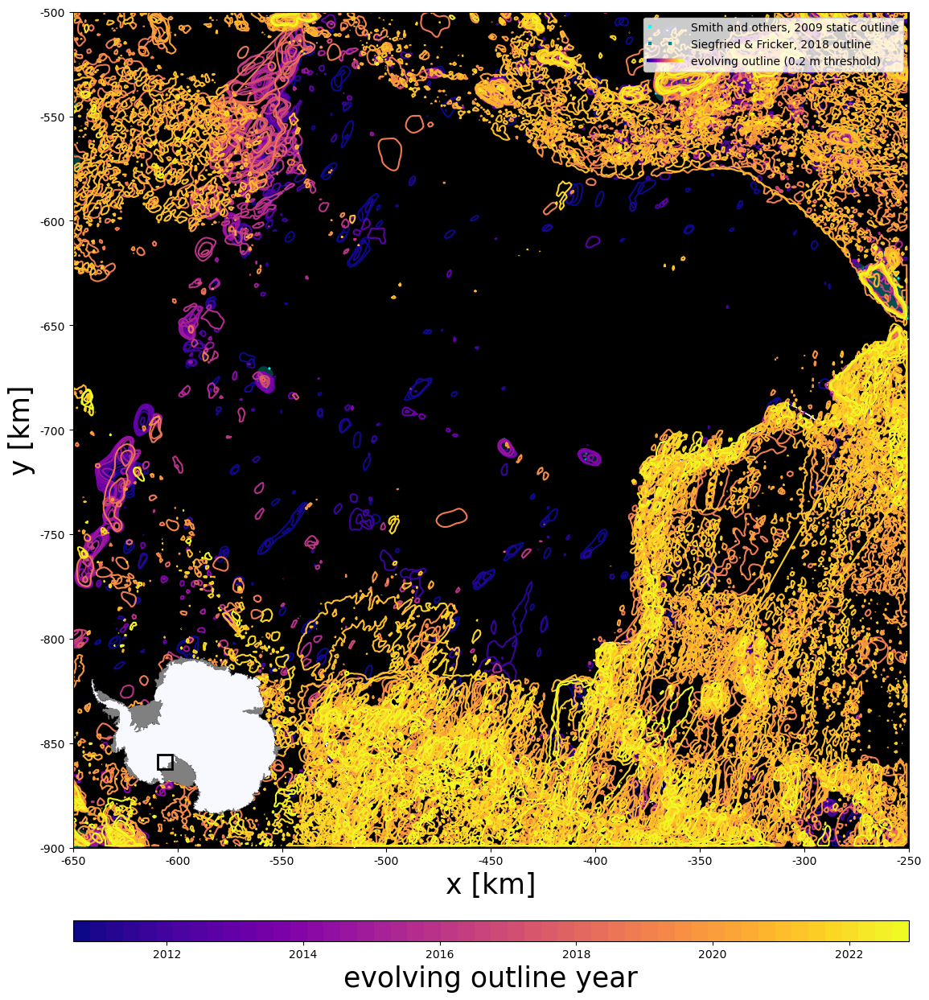

In [81]:
plot_evolving_outlines_time_series(gdf, CS2_dh, ATL15_dh_A3)

In [82]:
gdf_overlapping = find_overlapping_polygons(gdf)

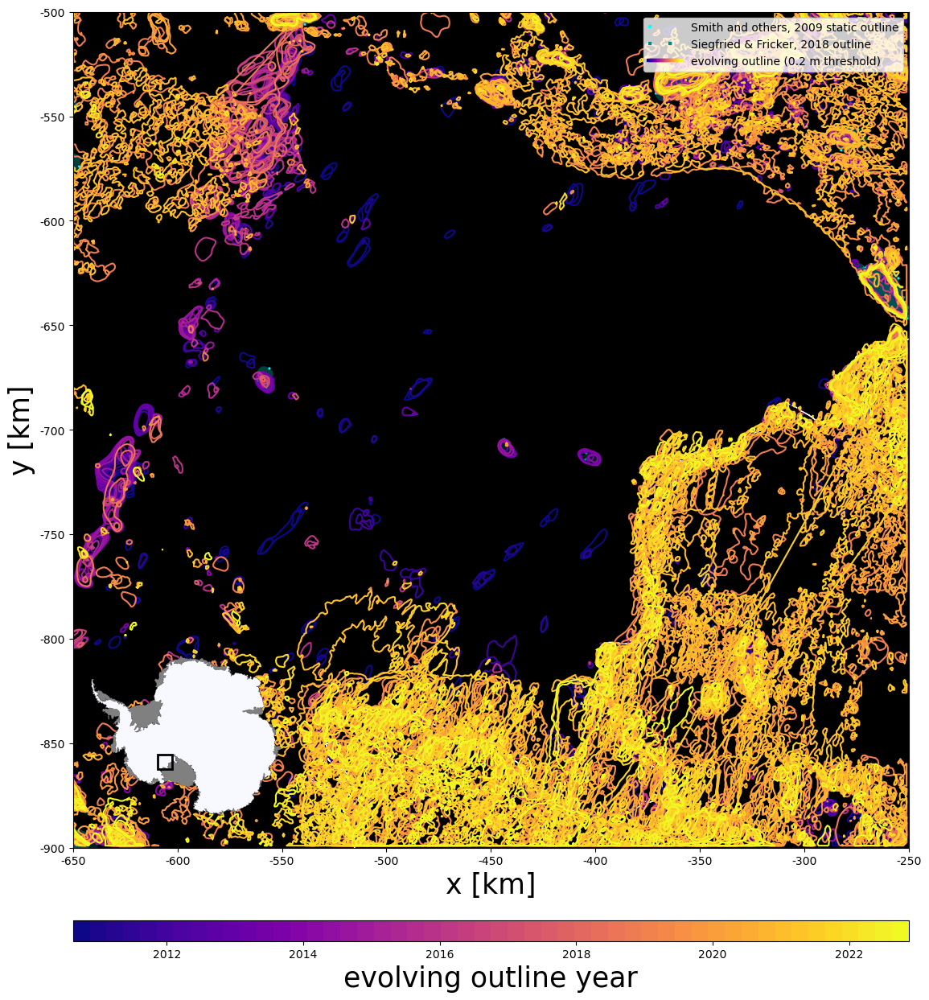

In [83]:
plot_evolving_outlines_time_series(gdf_overlapping, CS2_dh, ATL15_dh_A3)

In [84]:
gdf_overlapping_in_time = find_overlapping_polygons_in_time(gdf)

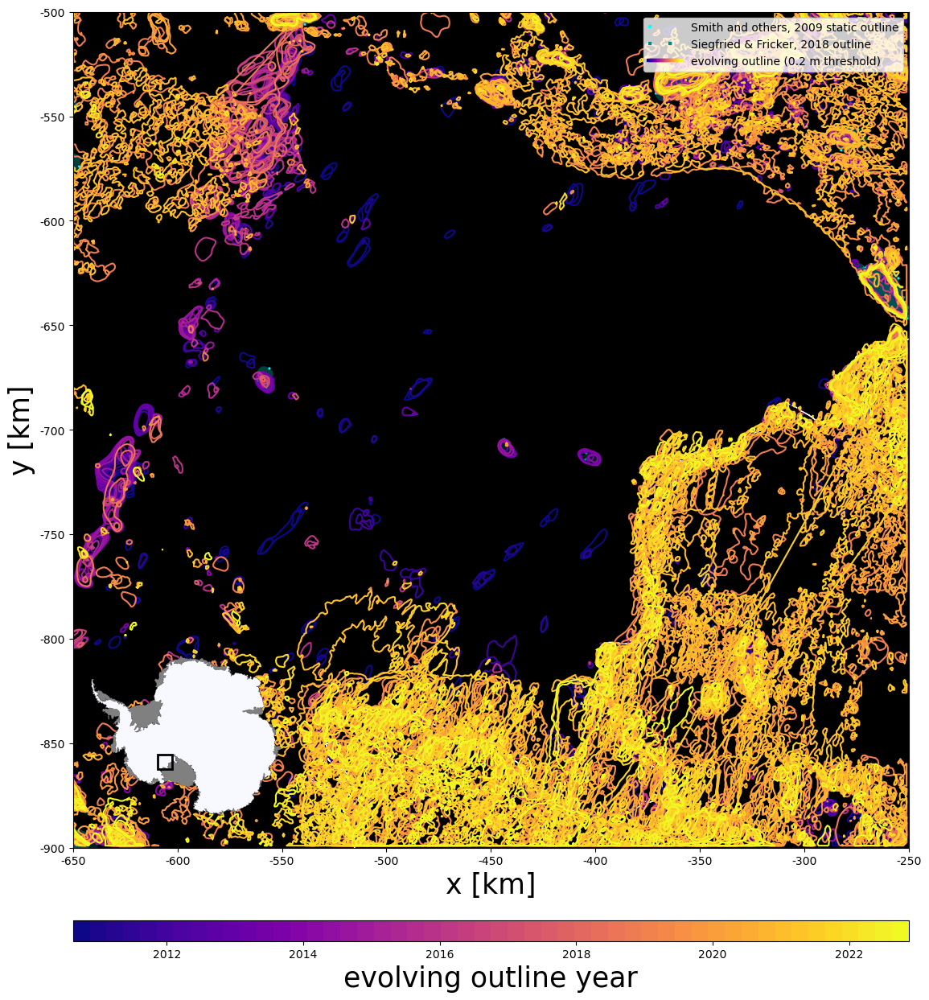

In [85]:
plot_evolving_outlines_time_series(gdf_overlapping_in_time, CS2_dh, ATL15_dh_A3)

In [86]:
gdf_intersecting = find_intersecting_polygons(gdf)

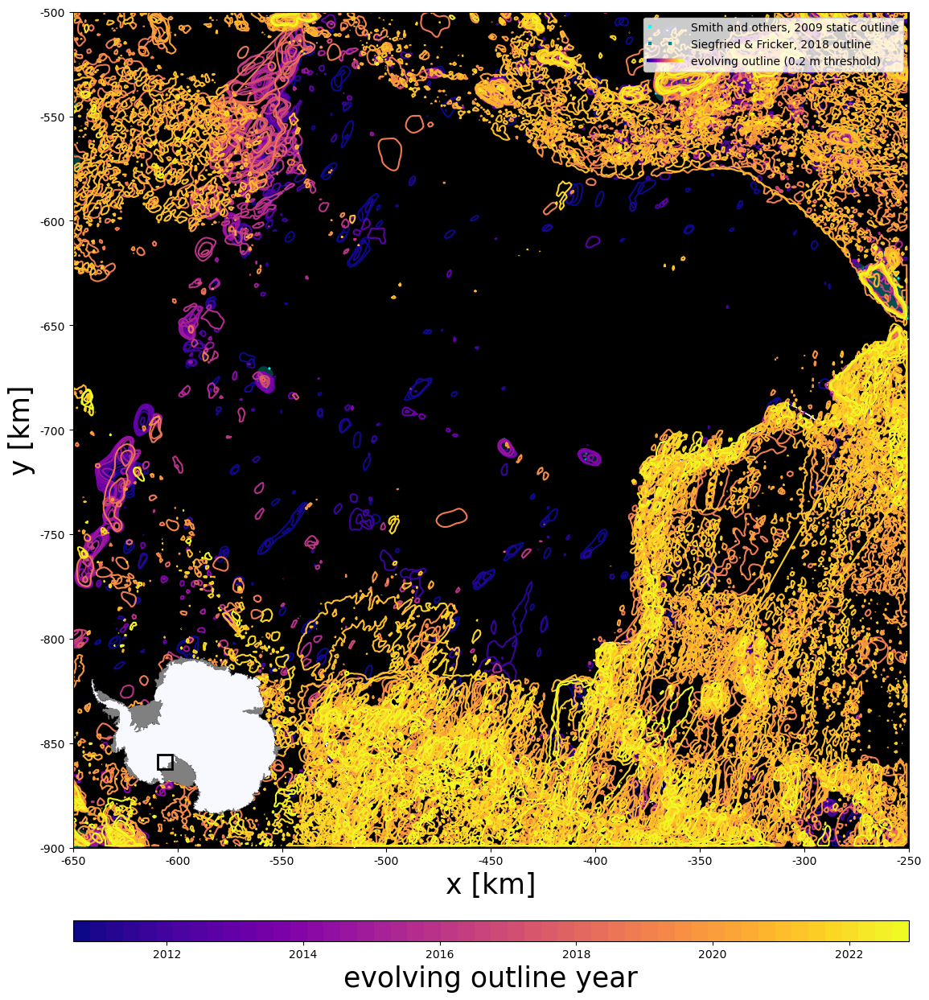

In [87]:
plot_evolving_outlines_time_series(gdf_intersecting, CS2_dh, ATL15_dh_A3)

In [88]:
gdf_intersecting_in_time = find_intersecting_polygons_in_time(gdf)

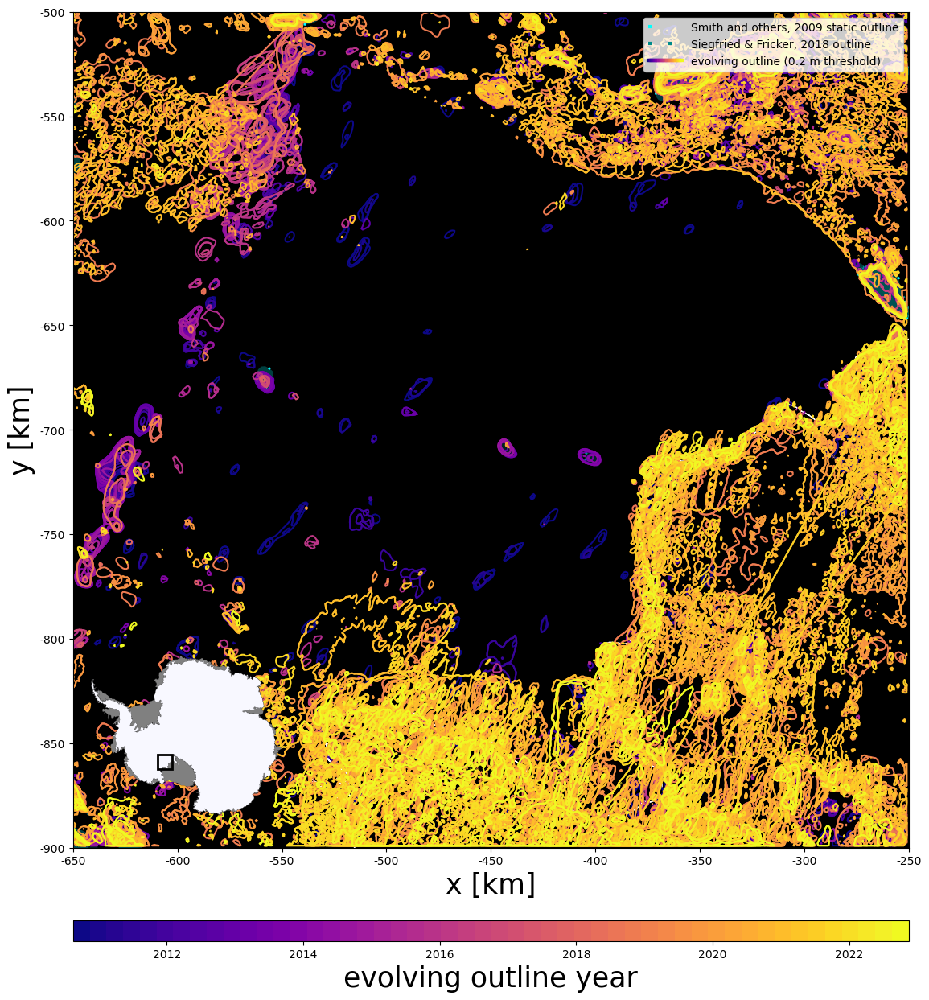

In [89]:
plot_evolving_outlines_time_series(gdf_intersecting_in_time, CS2_dh, ATL15_dh_A3)

## Trying Matt's suggested method of finding lake candidates:
* Start with larger threshold (e.g., 0.5, 0.4, 0.3)
* filter out non-intersecting and non-intersecting-in-time outlines
* cluster polygons into groups of lakes and lake candidates
* find the avg centroid of clusters of outlines
* from there, zoom into scene around previously identified lakes and lake candidates and use lower threshold (e.g. 0.2, 0.1) to capture as much signal as possible of lake
* you can find instances were two or more avg centroids should be merged as one lake with the following test:
* keep contour ATL15_dh_A3.x.min.valuesif one centroid within outline
* if two or more centroids within outline, then that is flag to investigate that outline more in depth to see if two or more avg centroids should be merged as one lake

In [51]:
# Manually select bbox coords of Kamb Truck
ROI = 'A3'
buffer = 10000
x_min, y_min = (ATL15_dh_A3.x.min().values, ATL15_dh_A3.y.min().values)
x_max, y_max = (ATL15_dh_A3.x.max().values, ATL15_dh_A3.y.max().values)

In [52]:
# create_dirs(['func_name'], base_directory=OUTPUT_DIR)

In [53]:
threshold = 0.5
gdf = find_evolving_outlines(ROI, x_min, x_max, y_min, y_max, threshold, buffer, CS2_dh, ATL15_dh_A3)

In [54]:
gdf

,geometry,evolving area (km^2),perim (km),datetime,centroid,date
0,"POLYGON ((-1820014.077 -302929.257, -1821013.5...",104.986694,46.927749,2010-08-17 06:45:00,POINT (-1813327.041 -297275.851),2010-08-17
1,"POLYGON ((-1624120.195 -463548.780, -1623120.7...",360.647529,74.335002,2010-08-17 06:45:00,POINT (-1612072.394 -472124.097),2010-08-17
2,"POLYGON ((-353808.338 -536781.512, -354807.796...",104.509942,48.548989,2010-08-17 06:45:00,POINT (-359064.363 -532595.445),2010-08-17
3,"POLYGON ((-1362262.047 -560734.354, -1363261.5...",60.172407,45.544426,2010-08-17 06:45:00,POINT (-1356502.321 -555217.406),2010-08-17
4,"POLYGON ((-557697.888 -556903.553, -558697.347...",2.522130,5.906449,2010-08-17 06:45:00,POINT (-558074.034 -556095.753),2010-08-17
...,...,...,...,...,...,...
25208,"POLYGON ((-816315.010 -1261037.376, -815627.27...",22.785218,17.908349,2023-02-15 21:45:00,POINT (-818022.088 -1258792.600),2023-02-15
25209,"POLYGON ((-931292.256 -1262036.613, -930637.12...",3.934456,7.560713,2023-02-15 21:45:00,POINT (-932068.803 -1261093.612),2023-02-15
25210,"POLYGON ((-910506.768 -1259775.482, -911506.22...",48.073187,33.871179,2023-02-15 21:45:00,POINT (-916924.070 -1264531.198),2023-02-15
25211,"POLYGON ((-608670.276 -1263123.375, -609669.73...",13.166177,17.498845,2023-02-15 21:45:00,POINT (-611160.019 -1265986.630),2023-02-15


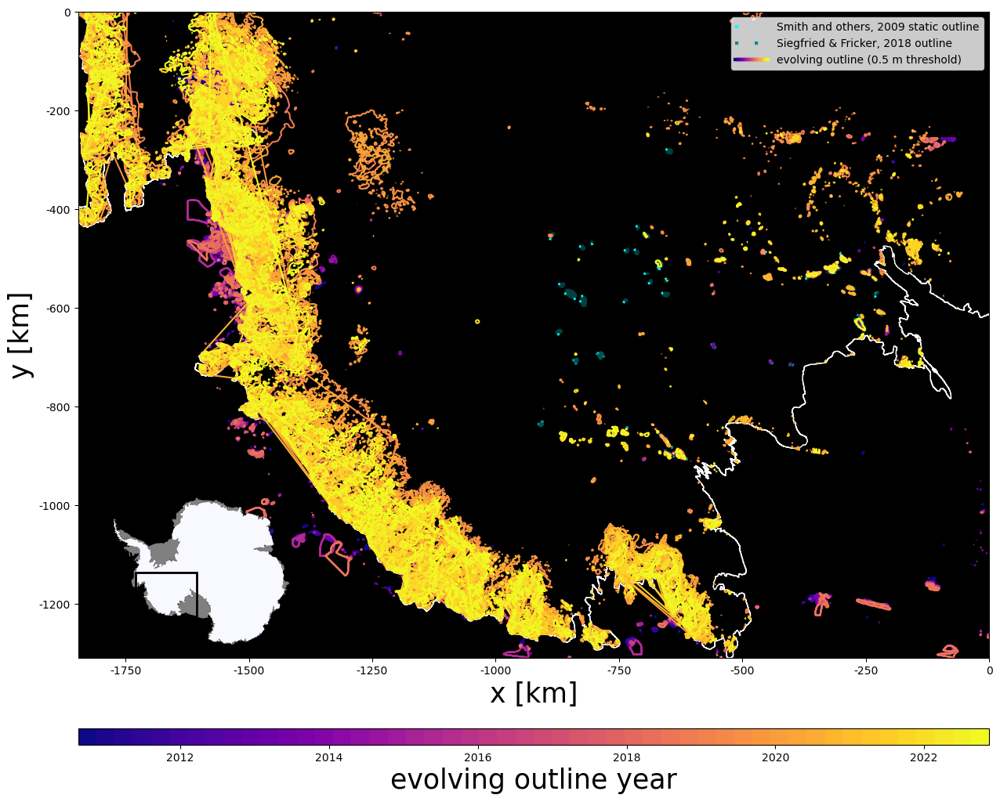

In [55]:
plot_evolving_outlines_time_series(gdf, CS2_dh, ATL15_dh_A3)

In [56]:
gdf_intersecting_in_time = find_intersecting_polygons_in_time(gdf)

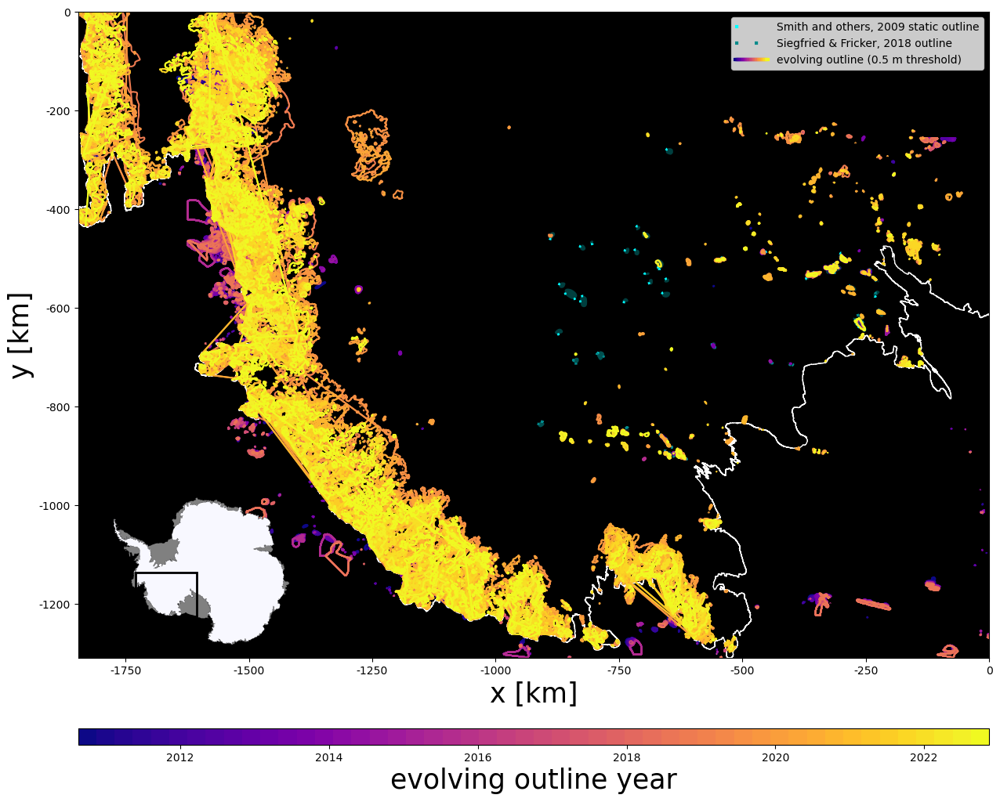

In [57]:
plot_evolving_outlines_time_series(gdf_intersecting_in_time, CS2_dh, ATL15_dh_A3)

## Alt strategy: 
* Integrated time signal for longer signal of lakes (rolling window?) or perhaps just a time series of cumulative height change and create contours around areas that exceed a threshold over course of the total time series
* write python code that will difference rasters contained xarray dataset by the time variable and keep a running tuple of two rasters that contains the min and max cumulative differences from one time step to the next

In [43]:
# Calculate differences and initialize min/max cumulative differences
diff = ATL15_dh_A3['delta_h'].diff(dim='time')
min_cumulative_diff = diff.min(dim='time', keep_attrs=True)
max_cumulative_diff = diff.max(dim='time', keep_attrs=True)

# Calculate cumulative differences and update min/max
for i in range(1, len(ATL15_dh_A3['time'])):
    cumulative_diff = diff.isel(time=slice(0, i + 1)).sum(dim='time')
    
    min_cumulative_diff = xr.where(cumulative_diff < min_cumulative_diff, cumulative_diff, min_cumulative_diff)
    max_cumulative_diff = xr.where(cumulative_diff > max_cumulative_diff, cumulative_diff, max_cumulative_diff)

# Create a new variable with min/max cumulative differences
ATL15_dh_A3['cumulative_diff'] = xr.concat([min_cumulative_diff, max_cumulative_diff], dim='cumulative_diff_dim')

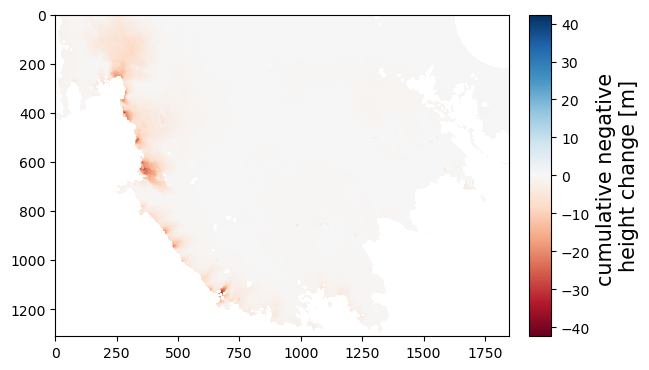

In [44]:
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['cumulative_diff'][0,:,:], norm=colors.CenteredNorm(), cmap='RdBu')
# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative negative \nheight change [m]', size=15)

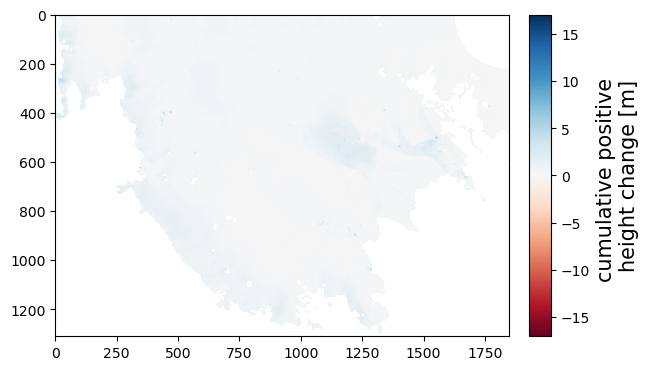

In [45]:
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['cumulative_diff'][1,:,:], norm=colors.CenteredNorm(), cmap='RdBu')
# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative positive \nheight change [m]', size=15)

In [47]:
# Calculate differences and initialize cumulative differences
diff = ATL15_dh_A3['delta_h'].diff(dim='time')

# Initialize cumulative difference variables
cumulative_diff_min = diff.isel(time=0)
cumulative_diff_max = diff.isel(time=0)

# Calculate cumulative differences
for i in range(1, len(ATL15_dh_A3['time'])-1):
    cumulative_diff_min += xr.where(diff.isel(time=i) < cumulative_diff_min, diff.isel(time=i), 0)
    cumulative_diff_max += xr.where(diff.isel(time=i) > cumulative_diff_max, diff.isel(time=i), 0)

# Create a new variable with cumulative differences
ATL15_dh_A3['cumulative_diff_2'] = xr.concat([cumulative_diff_min, cumulative_diff_max], dim='cumulative_diff_dim')

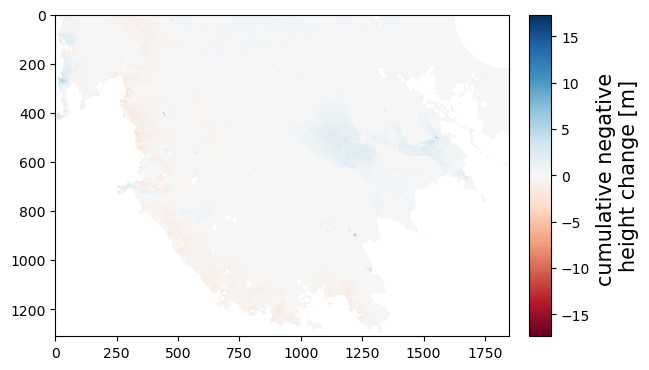

In [51]:
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['cumulative_diff_2'][0,:,:], norm=colors.CenteredNorm(), cmap='RdBu')
# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative negative \nheight change [m]', size=15)

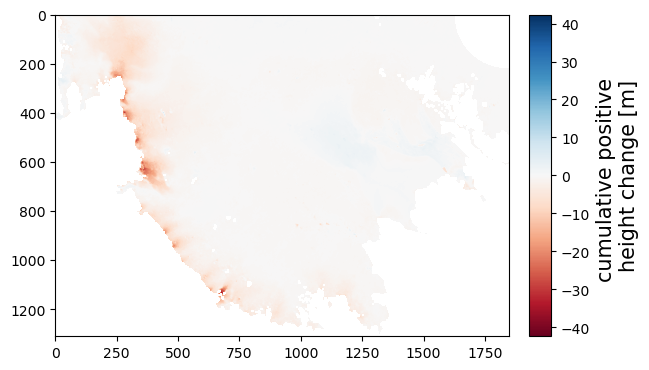

In [42]:
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['cumulative_diff_2'][1,:,:], norm=colors.CenteredNorm(), cmap='RdBu')
# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative positive \nheight change [m]', size=15)

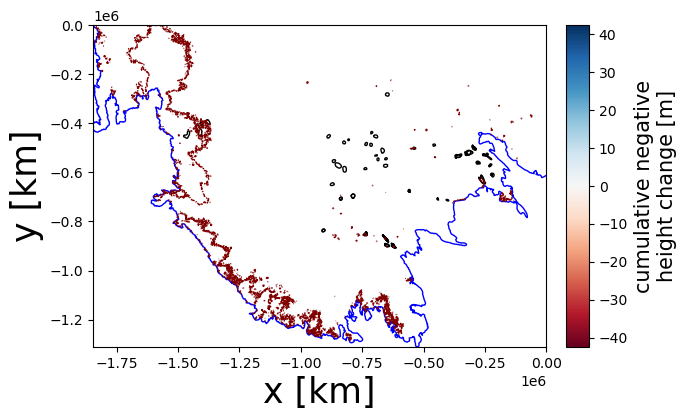

In [77]:
threshold = 3
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['cumulative_diff_2'][0,:,:], norm=colors.CenteredNorm(), cmap='RdBu')

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

img = ax.imshow(ATL15_dh_A3['cumulative_diff_2'][0,:,:],
                extent=[x_min, x_max, y_min, y_max], origin='upper',
                norm=colors.CenteredNorm(), cmap='RdBu')

contours_pos = measure.find_contours(ATL15_dh_A3['cumulative_diff_2'][0,:,:].values, threshold)
contours_neg = measure.find_contours(ATL15_dh_A3['cumulative_diff_2'][0,:,:].values, -threshold)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
x_conv = (x_max-x_min)/ATL15_dh_A3['cumulative_diff_2'][0,:,:].shape[1]
y_conv = (y_max-y_min)/ATL15_dh_A3['cumulative_diff_2'][0,:,:].shape[0]
# for i in range(len(contours_pos)):
#     x = x_min+contours_pos[i][:,1]*x_conv
#     y = y_max-contours_pos[i][:,0]*y_conv
#     ax.plot(x, y, color='mediumblue', linestyle='dashdot', linewidth=1, label=threshold)
for i in range(len(contours_neg)):
    x = x_min+contours_neg[i][:,1]*x_conv
    y = y_max-contours_neg[i][:,0]*y_conv
    ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), linewidth=1, label=-threshold)

# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative negative\nheight change [m]', size=15)

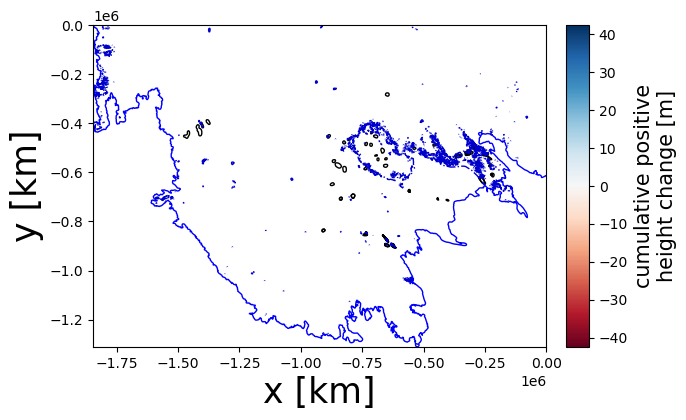

In [83]:
threshold = 1
# Visualize the result
fig, ax = plt.subplots()

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

img = ax.imshow(ATL15_dh_A3['cumulative_diff_2'][1,:,:], 
                extent=[x_min, x_max, y_min, y_max], origin='upper',
                norm=colors.CenteredNorm(), cmap='RdBu')

contours_pos = measure.find_contours(ATL15_dh_A3['cumulative_diff_2'][0,:,:].values, threshold)
contours_neg = measure.find_contours(ATL15_dh_A3['cumulative_diff_2'][0,:,:].values, -threshold)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
x_conv = (x_max-x_min)/ATL15_dh_A3['cumulative_diff_2'][0,:,:].shape[1]
y_conv = (y_max-y_min)/ATL15_dh_A3['cumulative_diff_2'][0,:,:].shape[0]
for i in range(len(contours_pos)):
    x = x_min+contours_pos[i][:,1]*x_conv
    y = y_max-contours_pos[i][:,0]*y_conv
    ax.plot(x, y, color='mediumblue', linestyle='dashdot', linewidth=1, label=threshold)
# for i in range(len(contours_neg)):
#     x = x_min+contours_neg[i][:,1]*x_conv
#     y = y_max-contours_neg[i][:,0]*y_conv
#     ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), linewidth=1, label=-threshold)

# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative positive\nheight change [m]', size=15)

In [49]:
ATL15_dh_A3['test'] = ATL15_dh_A3['cumulative_diff_2'] - ATL15_dh_A3['cumulative_diff']

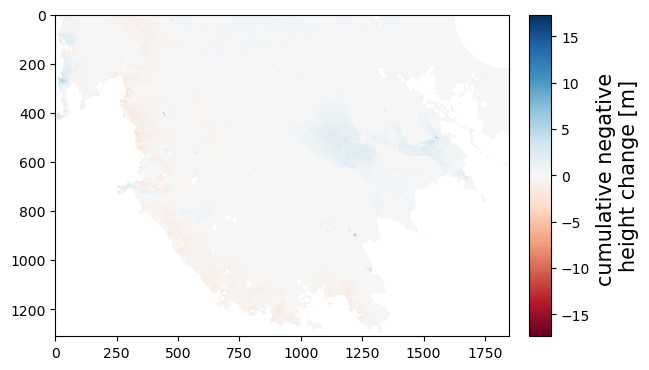

In [52]:
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['test'][0,:,:], norm=colors.CenteredNorm(), cmap='RdBu')
# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative negative \nheight change [m]', size=15)

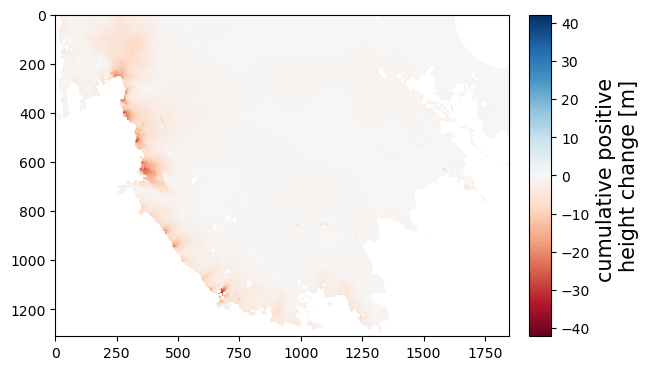

In [53]:
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['test'][1,:,:], norm=colors.CenteredNorm(), cmap='RdBu')
# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative positive \nheight change [m]', size=15)

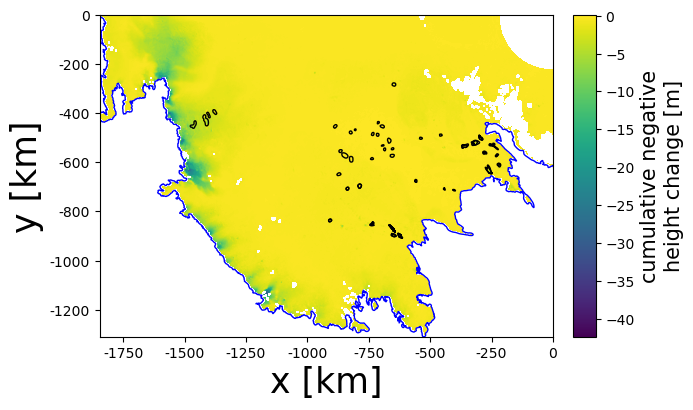

In [83]:
# Visualize the result
fig, ax = plt.subplots()

# Overlay published active lake outlines for visual comparison and grounding line
S09_color = 'cyan'
SF18_color  = 'darkcyan'
S23_color = 'deepskyblue'
S09_color = 'k'
SF18_color  = 'k'
S23_color = 'k'
# Smith2009_outlines.boundary.plot(ax=ax, facecolor=S09_color, linestyle=(0, (1, 10)), linewidth=2, alpha=0.25)
Smith2009_outlines.boundary.plot(ax=ax, edgecolor=S09_color, linestyle='solid', linewidth=1)
# SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, facecolor=SF18_color, linestyle=(0, (1, 5)), linewidth=2, alpha=0.25)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor=SF18_color, linestyle='solid', linewidth=1)
# Sauthoff2023_S23outlines.boundary.plot(ax=ax, facecolor=S23_color, linestyle=(0, (1, 1)), linewidth=2, alpha=0.25)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor=S23_color, linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Change polar stereographic m to km for cleaner-looking axes labels
km_scale = 1e3
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_aspect('equal')

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

img = ax.imshow(ATL15_dh_A3['cumulative_diff'][0,:,:], 
    extent=[x_min, x_max, y_min, y_max], 
    origin='upper')

# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative negative\nheight change [m]', size=15)

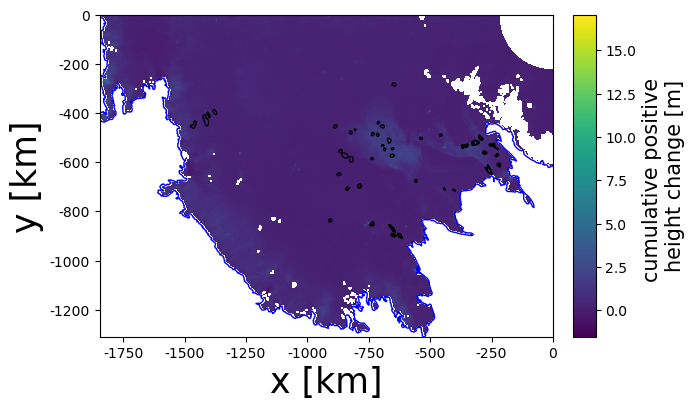

In [84]:
# Visualize the result
fig, ax = plt.subplots()

# Overlay published active lake outlines for visual comparison and grounding line
S09_color = 'cyan'
SF18_color  = 'darkcyan'
S23_color = 'deepskyblue'
S09_color = 'k'
SF18_color  = 'k'
S23_color = 'k'
# Smith2009_outlines.boundary.plot(ax=ax, facecolor=S09_color, linestyle=(0, (1, 10)), linewidth=2, alpha=0.25)
Smith2009_outlines.boundary.plot(ax=ax, edgecolor=S09_color, linestyle='solid', linewidth=1)
# SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, facecolor=SF18_color, linestyle=(0, (1, 5)), linewidth=2, alpha=0.25)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor=SF18_color, linestyle='solid', linewidth=1)
# Sauthoff2023_S23outlines.boundary.plot(ax=ax, facecolor=S23_color, linestyle=(0, (1, 1)), linewidth=2, alpha=0.25)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor=S23_color, linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Change polar stereographic m to km for cleaner-looking axes labels
km_scale = 1e3
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_aspect('equal')

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

img = ax.imshow(ATL15_dh_A3['cumulative_diff'][1,:,:], 
    extent=[x_min, x_max, y_min, y_max], 
    origin='upper')

# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('cumulative positive \nheight change [m]', size=15)

In [ ]:
# Investigating chatgpt code to see if working properly

In [21]:
# Creating small synthetic example to ensure code is working properly
import numpy as np
import pandas as pd
import xarray as xr

# Create sample data
x_values = np.linspace(1, 3, 3)
y_values = np.linspace(1, 3, 3)
time_values = pd.date_range("2023-01-01", periods=5, freq="D")
data_values = np.array(
    [[[0, .2, 0],
    [.2, .4, .2],
    [0, .2, 0]],
                       
    [[0, .3, 0],
    [.3, .5, .3],
    [0, .3, 0]],
                       
    [[0, -.2, 0],
    [-.2, -.4, -.2],
    [0, -.2, 0]],
                       
    [[0, -.3, 0],
    [-.3, -.5, -.3],
    [0, -.3, 0]],
                       
    [[0, 0, 0],
    [0, 0, 0],
    [0, 0, 0]]])

# Create xarray dataset
ds = xr.Dataset(
    {
        "data": (["time", "y", "x"], data_values),
    },
    coords={
        "x": x_values,
        "y": y_values,
        "time": time_values,
    },
)

# View the dataset
ds

<xarray.Dataset>
Dimensions:  (time: 5, y: 3, x: 3)
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0
  * time     (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-05
Data variables:
    data     (time, y, x) float64 0.0 0.2 0.0 0.2 0.4 ... 0.0 0.0 0.0 0.0 0.0

In [80]:
diff = ds['data'].diff(dim='time')
diff

<xarray.DataArray 'data' (time: 4, y: 3, x: 3)>
array([[[ 0. ,  0.1,  0. ],
        [ 0.1,  0.1,  0.1],
        [ 0. ,  0.1,  0. ]],

       [[ 0. , -0.5,  0. ],
        [-0.5, -0.9, -0.5],
        [ 0. , -0.5,  0. ]],

       [[ 0. , -0.1,  0. ],
        [-0.1, -0.1, -0.1],
        [ 0. , -0.1,  0. ]],

       [[ 0. ,  0.3,  0. ],
        [ 0.3,  0.5,  0.3],
        [ 0. ,  0.3,  0. ]]])
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0
  * time     (time) datetime64[ns] 2023-01-02 2023-01-03 2023-01-04 2023-01-05

In [8]:
# Creating small synthetic example to ensure code is working properly
import numpy as np
import pandas as pd
import xarray as xr

# Create sample data
x_values = np.linspace(1, 3, 3)
y_values = np.linspace(1, 3, 3)
time_values = pd.date_range("2023-01-01", periods=5, freq="D")
data_values = np.array(
    [[[0, .2, 0],
    [.2, -.4, .2],
    [0, .2, 0]],
                       
    [[0, .3, 0],
    [.3, -.5, .3],
    [0, .3, 0]],
                       
    [[0, -.2, 0],
    [-.2, .4, -.2],
    [0, -.2, 0]],
                       
    [[0, -.3, 0],
    [-.3, .5, -.3],
    [0, -.3, 0]],
                       
    [[0, 0, 0],
    [0, 0, 0],
    [0, 0, 0]]])

# Create xarray dataset
ds = xr.Dataset(
    {
        "data": (["time", "y", "x"], data_values),
    },
    coords={
        "x": x_values,
        "y": y_values,
        "time": time_values,
    },
)

# View the dataset
ds

<xarray.Dataset>
Dimensions:  (time: 5, y: 3, x: 3)
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0
  * time     (time) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-01-05
Data variables:
    data     (time, y, x) float64 0.0 0.2 0.0 0.2 -0.4 ... 0.0 0.0 0.0 0.0 0.0

In [ ]:
# Calculate differences and initialize min/max cumulative differences
cumsum = ds['data'].cumsum(dim='time')
min_cumsum = cumsum.min(dim='time', keep_attrs=True)
max_cumsum = cumsum.max(dim='time', keep_attrs=True)
print(min_cumsum)
print(max_cumsum)

# # Calculate cumulative differences and update min/max
# for i in range(1, len(ds['data'])):
#     cumulative_diff = diff.isel(time=slice(0, i + 1)).sum(dim='time')
#     # print(cumulative_diff)
#     min_cumulative_diff = xr.where(cumulative_diff < min_cumulative_diff, cumulative_diff, min_cumulative_diff)
#     max_cumulative_diff = xr.where(cumulative_diff > max_cumulative_diff, cumulative_diff, max_cumulative_diff)

# # Create a new variable with min/max cumulative differences
# ds['cumulative_diff'] = xr.concat([min_cumulative_diff, max_cumulative_diff], dim='cumulative_diff_dim')

In [54]:
# Calculate differences and initialize min/max cumulative differences

# print(min_cumsum)
# print(max_cumsum)
min_cumsums = []
max_cumsums = []

# Calculate cumulative differences and update min/max
for i in range(0, len(ds['data'])):
    cumsum = ds['data'][i:,:,:].cumsum(dim='time')
    min_cumsum = cumsum.min(dim='time', keep_attrs=True)
    min_cumsums.append(min_cumsum)
    max_cumsum = cumsum.max(dim='time', keep_attrs=True)
    max_cumsums.append(max_cumsum)
    
min_cumsums_da = xr.concat(min_cumsums, dim='time')
max_cumsums_da = xr.concat(max_cumsums, dim='time')

grand_min_cumsum = min_cumsums_da.min(dim='time', keep_attrs=True)
grand_max_cumsum = max_cumsums_da.max(dim='time', keep_attrs=True)

# Create a new variable with min/max cumulative differences
ds['grand_cumsum'] = xr.concat([grand_min_cumsum, grand_max_cumsum], dim='grand_cumsum')

In [48]:
min_cumsums_da

<xarray.DataArray 'data' (time: 5, y: 3, x: 3)>
array([[[ 0. ,  0. ,  0. ],
        [ 0. ,  0. ,  0. ],
        [ 0. ,  0. ,  0. ]],

       [[ 0. , -0.2,  0. ],
        [-0.2, -0.4, -0.2],
        [ 0. , -0.2,  0. ]],

       [[ 0. , -0.5,  0. ],
        [-0.5, -0.9, -0.5],
        [ 0. , -0.5,  0. ]],

       [[ 0. , -0.3,  0. ],
        [-0.3, -0.5, -0.3],
        [ 0. , -0.3,  0. ]],

       [[ 0. ,  0. ,  0. ],
        [ 0. ,  0. ,  0. ],
        [ 0. ,  0. ,  0. ]]])
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0
Dimensions without coordinates: time

In [52]:
min_cumsums_da.min(dim='time', keep_attrs=True)

<xarray.DataArray 'data' (y: 3, x: 3)>
array([[ 0. , -0.5,  0. ],
       [-0.5, -0.9, -0.5],
       [ 0. , -0.5,  0. ]])
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0

In [51]:
max_cumsums_da

<xarray.DataArray 'data' (time: 5, y: 3, x: 3)>
array([[[ 0. ,  0.5,  0. ],
        [ 0.5,  0.9,  0.5],
        [ 0. ,  0.5,  0. ]],

       [[ 0. ,  0.3,  0. ],
        [ 0.3,  0.5,  0.3],
        [ 0. ,  0.3,  0. ]],

       [[ 0. , -0.2,  0. ],
        [-0.2, -0.4, -0.2],
        [ 0. , -0.2,  0. ]],

       [[ 0. , -0.3,  0. ],
        [-0.3, -0.5, -0.3],
        [ 0. , -0.3,  0. ]],

       [[ 0. ,  0. ,  0. ],
        [ 0. ,  0. ,  0. ],
        [ 0. ,  0. ,  0. ]]])
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0
Dimensions without coordinates: time

In [53]:
max_cumsums_da.max(dim='time', keep_attrs=True)

<xarray.DataArray 'data' (y: 3, x: 3)>
array([[0. , 0.5, 0. ],
       [0.5, 0.9, 0.5],
       [0. , 0.5, 0. ]])
Coordinates:
  * x        (x) float64 1.0 2.0 3.0
  * y        (y) float64 1.0 2.0 3.0

In [55]:
ds['grand_cumsum'] 

<xarray.DataArray 'grand_cumsum' (grand_cumsum: 2, y: 3, x: 3)>
array([[[ 0. , -0.5,  0. ],
        [-0.5, -0.9, -0.5],
        [ 0. , -0.5,  0. ]],

       [[ 0. ,  0.5,  0. ],
        [ 0.5,  0.9,  0.5],
        [ 0. ,  0.5,  0. ]]])
Coordinates:
  * x             (x) float64 1.0 2.0 3.0
  * y             (y) float64 1.0 2.0 3.0
    grand_cumsum  (grand_cumsum, y, x) float64 0.0 -0.5 0.0 -0.5 ... 0.0 0.5 0.0

In [81]:
# Trying with actual data

In [94]:
ATL15_dh_A3['dh'] = ATL15_dh_A3['delta_h'].diff(dim='time')

In [96]:
ATL15_dh_A3['dh']

<xarray.Dataset>
Dimensions:              (time: 19, x: 1847, y: 1311)
Coordinates:
  * time                 (time) float64 273.9 365.2 ... 1.826e+03 1.918e+03
  * x                    (x) float64 -1.846e+06 -1.845e+06 ... -1e+03 0.0
  * y                    (y) float64 0.0 -1e+03 -2e+03 ... -1.309e+06 -1.31e+06
    Polar_Stereographic  int64 0
    spatial_ref          int64 0
Data variables:
    ice_area             (time, y, x) float32 nan 1.012e+06 ... nan nan
    delta_h              (time, y, x) float32 nan 0.6688 0.5822 ... nan nan nan
    delta_h_sigma        (time, y, x) float32 nan 0.07068 0.07086 ... nan nan
    data_count           (time, y, x) float32 nan 0.008972 nan ... nan nan nan
    misfit_rms           (time, y, x) float32 nan 0.00238 nan ... nan nan nan
    misfit_scaled_rms    (time, y, x) float32 nan 0.2861 nan nan ... nan nan nan
    dh                   (time, y, x) float32 nan nan nan nan ... nan nan nan
Attributes: (12/115)
    description:                        This data set (ATL15) contains season...
    identifier:                         SET_BY_PGE
    pulse_rate:                         10000 pps
    type:                               SET_BY_META
    wavelength:                         532 nm
    Description:                        Describe the group
    ...                                 ...
    summary:                            SET_BY_META
    time_coverage_duration:             127871867.64814
    time_coverage_end:                  2023-04-16T23:57:48.648140Z
    time_coverage_start:                2019-03-29T00:00:01.000000Z
    time_type:                          CCSDS UTC-A
    vertical_datum:                     WGS84

In [97]:
# Calculate differences and initialize min/max cumulative differences

# print(min_cumsum)
# print(max_cumsum)
min_cumsums = []
max_cumsums = []

# Calculate cumulative differences and update min/max
for i in range(0, len(ATL15_dh_A3['dh'])):
    cumsum = ATL15_dh_A3['dh'][i:,:,:].cumsum(dim='time')
    min_cumsum = cumsum.min(dim='time', keep_attrs=True)
    min_cumsums.append(min_cumsum)
    max_cumsum = cumsum.max(dim='time', keep_attrs=True)
    max_cumsums.append(max_cumsum)
    
min_cumsums_da = xr.concat(min_cumsums, dim='time')
max_cumsums_da = xr.concat(max_cumsums, dim='time')

grand_min_cumsum = min_cumsums_da.min(dim='time', keep_attrs=True)
grand_max_cumsum = max_cumsums_da.max(dim='time', keep_attrs=True)

# Create a new variable with min/max cumulative differences
ATL15_dh_A3['dh_grand_cumsum'] = xr.concat([grand_min_cumsum, grand_max_cumsum], dim='dh_grand_cumsum')

In [98]:
ATL15_dh_A3['dh_grand_cumsum']

<xarray.DataArray 'dh_grand_cumsum' (dh_grand_cumsum: 2, y: 1311, x: 1847)>
array([[[ 0.        , -0.8635864 , -0.8679199 , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        , -0.8272095 , -0.83776855, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        , -0.8033447 , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[ 0.        ,  0.8442993 ,  1.1761475 , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.92492676,  1.3962402 , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  1.7266846 , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]]], dtype=float32)
Coordinates:
  * x                    (x) float64 -1.846e+06 -1.845e+06 ... -1e+03 0.0
  * y                    (y) float64 0.0 -1e+03 -2e+03 ... -1.309e+06 -1.31e+06
    Polar_Stereographic  int64 0
    spatial_ref          int64 0
    dh_grand_cumsum      (dh_grand_cumsum, y, x) float32 0.0 -0.8636 ... 0.0 0.0

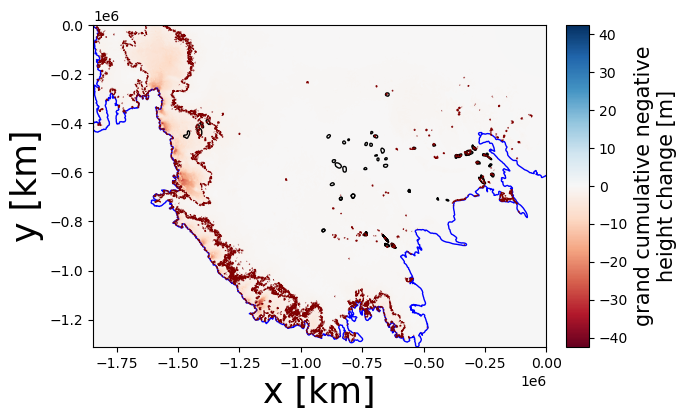

In [112]:
threshold = 2
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['dh_grand_cumsum'][0,:,:], 
                extent=[x_min, x_max, y_min, y_max], origin='upper',
                norm=colors.CenteredNorm(), cmap='RdBu')

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

contours_pos = measure.find_contours(ATL15_dh_A3['dh_grand_cumsum'][1,:,:].values, threshold)
contours_neg = measure.find_contours(ATL15_dh_A3['dh_grand_cumsum'][0,:,:].values, -threshold)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
x_conv = (x_max-x_min)/ATL15_dh_A3['dh_grand_cumsum'][0,:,:].shape[1]
y_conv = (y_max-y_min)/ATL15_dh_A3['dh_grand_cumsum'][0,:,:].shape[0]
# for i in range(len(contours_pos)):
#     x = x_min+contours_pos[i][:,1]*x_conv
#     y = y_max-contours_pos[i][:,0]*y_conv
#     ax.plot(x, y, color='mediumblue', linestyle='dashdot', linewidth=1, label=threshold)
for i in range(len(contours_neg)):
    x = x_min+contours_neg[i][:,1]*x_conv
    y = y_max-contours_neg[i][:,0]*y_conv
    ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), linewidth=1, label=-threshold)

# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('grand cumulative negative\nheight change [m]', size=15)

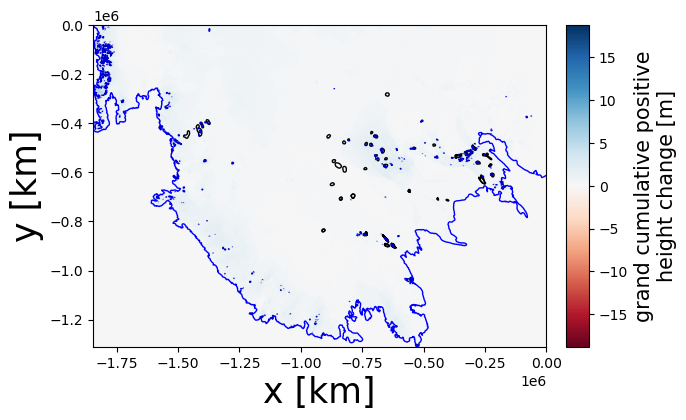

In [126]:
threshold = 2.5
# Visualize the result
fig, ax = plt.subplots()
img = ax.imshow(ATL15_dh_A3['dh_grand_cumsum'][1,:,:], 
                extent=[x_min, x_max, y_min, y_max], origin='upper',
                norm=colors.CenteredNorm(), cmap='RdBu')

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

contours_pos = measure.find_contours(ATL15_dh_A3['dh_grand_cumsum'][1,:,:].values, threshold)
contours_neg = measure.find_contours(ATL15_dh_A3['dh_grand_cumsum'][0,:,:].values, -threshold)
x_min, x_max = (ATL15_dh_A3['x'].min().values, ATL15_dh_A3['x'].max().values)
y_min, y_max = (ATL15_dh_A3['y'].min().values, ATL15_dh_A3['y'].max().values)
x_conv = (x_max-x_min)/ATL15_dh_A3['dh_grand_cumsum'][0,:,:].shape[1]
y_conv = (y_max-y_min)/ATL15_dh_A3['dh_grand_cumsum'][0,:,:].shape[0]
for i in range(len(contours_pos)):
    x = x_min+contours_pos[i][:,1]*x_conv
    y = y_max-contours_pos[i][:,0]*y_conv
    ax.plot(x, y, color='mediumblue', linestyle='dashdot', linewidth=1, label=threshold)
# for i in range(len(contours_neg)):
#     x = x_min+contours_neg[i][:,1]*x_conv
#     y = y_max-contours_neg[i][:,0]*y_conv
#     ax.plot(x, y, color='maroon', linestyle=(0, (3, 1, 1, 1)), linewidth=1, label=-threshold)

# Add colorbar 
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.2)
fig.colorbar(img, cax=cax).set_label('grand cumulative positive\nheight change [m]', size=15)

In [35]:
# Trying continent wide with func's
find_cumsums(ATL15_dh)

In [36]:
gdf_5m = find_candidates(ATL15_dh, 5)

In [37]:
gdf_5m

,geometry,area (km^2),perim (km),min_or_max,centroid
0,"POLYGON ((1077474.445 1869067.178, 1077298.297...",0.037228,0.808470,min,POINT (1077303.916 1869050.283)
1,"POLYGON ((1357586.996 1662115.295, 1357559.827...",6.658975,10.109249,min,POINT (1355942.976 1663206.682)
2,"POLYGON ((1833541.454 1614126.453, 1833150.323...",0.067848,1.173846,min,POINT (1833253.230 1614083.909)
3,"POLYGON ((-2472214.441 1560139.005, -2472006.8...",29.932734,20.628232,min,POINT (-2474235.008 1562568.003)
4,"POLYGON ((-497193.902 1527146.676, -496393.619...",3.221123,6.772657,min,POINT (-497120.459 1528121.404)
...,...,...,...,...,...
1025,"POLYGON ((1767161.284 -1875383.871, 1766161.48...",4.928585,9.474251,max,POINT (1765938.085 -1874568.590)
1026,"POLYGON ((1713171.854 -1895209.559, 1712172.04...",5.014003,8.306186,max,POINT (1711872.122 -1894430.412)
1027,"POLYGON ((1272258.172 -1973160.886, 1272218.11...",0.015237,0.520706,max,POINT (1272281.524 -1973051.006)
1028,"POLYGON ((1229266.588 -1989054.766, 1228266.78...",0.186509,2.386170,max,POINT (1228815.073 -1988996.231)


In [47]:
# basic stats on areas
print(gdf_5m['area (km^2)'].max())
print(gdf_5m['area (km^2)'].median())

37675.68004235086
1.8761761621252595


In [50]:
# consults matt’s inventory for median and max areas to find cut off to occlude larger area contours
print(SiegfriedFricker2018_outlines['area (m^2)'].max()/1e6)
print(SiegfriedFricker2018_outlines['area (m^2)'].median()/1e6)

1257.8696642202933
150.25004974152517


In [61]:
print(SiegfriedFricker2018_outlines[SiegfriedFricker2018_outlines['area (m^2)'] == SiegfriedFricker2018_outlines['area (m^2)'].max()])

        name                                           geometry    area (m^2)  \
97  Nimrod_2  POLYGON ((379048.308 -468526.253, 379290.572 -...  1.257870e+09   

    perimeter (m)                                               cite  
97  183270.656278  Smith and others, 2009, J. Glac., doi:10.3189/...  


In [54]:
SiegfriedFricker2018_outlines

,name,geometry,area (m^2),perimeter (m),cite
0,Bindschadler_1,"POLYGON ((-792264.327 -691480.857, -791281.458...",1.943146e+08,51147.562479,"Smith and others, 2009, J. Glac., doi:10.3189/..."
1,Bindschadler_2,"POLYGON ((-842788.063 -708464.240, -842354.948...",1.072249e+08,37249.152584,"Smith and others, 2009, J. Glac., doi:10.3189/..."
2,Bindschadler_3,"POLYGON ((-874893.221 -654533.044, -876415.673...",1.404559e+08,44183.483257,"Smith and others, 2009, J. Glac., doi:10.3189/..."
3,Bindschadler_4,"POLYGON ((-828821.778 -584874.415, -828822.032...",2.816411e+08,62680.016773,"Smith and others, 2009, J. Glac., doi:10.3189/..."
4,Bindschadler_5,"POLYGON ((-858067.460 -573467.564, -858714.391...",3.923966e+08,73686.203194,"Smith and others, 2009, J. Glac., doi:10.3189/..."
...,...,...,...,...,...
126,Whillans_6,"POLYGON ((-451544.869 -488823.261, -451209.964...",7.458477e+07,31952.842516,"Smith and others, 2009, J. Glac., doi:10.3189/..."
127,Whillans_7,"POLYGON ((-543163.376 -500759.165, -542800.367...",7.696570e+07,32373.996995,"Smith and others, 2009, J. Glac., doi:10.3189/..."
128,Whillans_8,"POLYGON ((-654478.748 -281124.560, -653777.327...",1.625714e+08,45873.974279,"Smith and others, 2009, J. Glac., doi:10.3189/..."
129,Wilkes_1,"POLYGON ((2214185.180 -666018.604, 2214317.389...",5.880773e+08,89565.314574,"Smith and others, 2009, J. Glac., doi:10.3189/..."


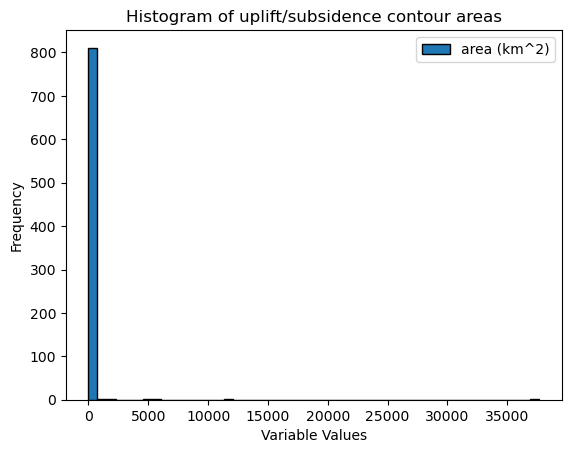

In [68]:
# Plot histo of outline areas; find cutoff area to remove large outliers
gdf_5m[gdf_5m['min_or_max'] == 'min']['area (km^2)'].plot.hist(bins=50, edgecolor='black')

# Add labels and title
plt.xlabel('Variable Values')
plt.ylabel('Frequency')
plt.title('Histogram of uplift/subsidence contour areas')

# Add legend
plt.legend()

# Show the plot
plt.show()

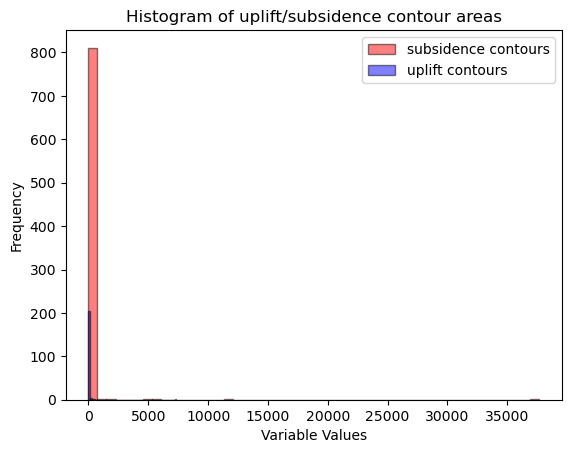

In [238]:
# Plot histogram for variable_name2 in orange with 50% opacity
gdf_5m[gdf_5m['min_or_max'] == 'min']['area (km^2)'].plot.hist(bins=50, edgecolor='black', color='red', alpha=0.5, label='subsidence contours')
gdf_5m[gdf_5m['min_or_max'] == 'max']['area (km^2)'].plot.hist(bins=50, edgecolor='black', color='blue', alpha=0.5, label='uplift contours')

# Add labels and title
plt.xlabel('Variable Values')
plt.ylabel('Frequency')
plt.title('Histogram of uplift/subsidence contour areas')

# Add legend
plt.legend()

# Show the plot
plt.show()

In [70]:
gdf_5m_subset = gdf_5m[gdf_5m['area (km^2)'] <= (SiegfriedFricker2018_outlines['area (m^2)'].max()/1e6)]
gdf_5m_subset

,geometry,area (km^2),perim (km),min_or_max,centroid
0,"POLYGON ((1077474.445 1869067.178, 1077298.297...",0.037228,0.808470,min,POINT (1077303.916 1869050.283)
1,"POLYGON ((1357586.996 1662115.295, 1357559.827...",6.658975,10.109249,min,POINT (1355942.976 1663206.682)
2,"POLYGON ((1833541.454 1614126.453, 1833150.323...",0.067848,1.173846,min,POINT (1833253.230 1614083.909)
3,"POLYGON ((-2472214.441 1560139.005, -2472006.8...",29.932734,20.628232,min,POINT (-2474235.008 1562568.003)
4,"POLYGON ((-497193.902 1527146.676, -496393.619...",3.221123,6.772657,min,POINT (-497120.459 1528121.404)
...,...,...,...,...,...
1025,"POLYGON ((1767161.284 -1875383.871, 1766161.48...",4.928585,9.474251,max,POINT (1765938.085 -1874568.590)
1026,"POLYGON ((1713171.854 -1895209.559, 1712172.04...",5.014003,8.306186,max,POINT (1711872.122 -1894430.412)
1027,"POLYGON ((1272258.172 -1973160.886, 1272218.11...",0.015237,0.520706,max,POINT (1272281.524 -1973051.006)
1028,"POLYGON ((1229266.588 -1989054.766, 1228266.78...",0.186509,2.386170,max,POINT (1228815.073 -1988996.231)


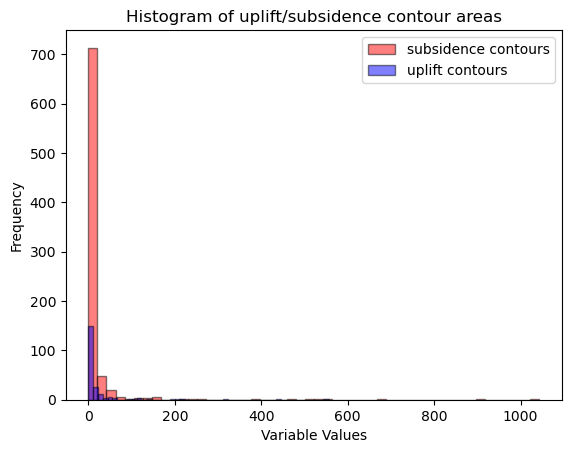

In [304]:
# Plot histogram for variable_name2 in orange with 50% opacity
gdf_5m_subset[gdf_5m_subset['min_or_max'] == 'min']['area (km^2)'].plot.hist(bins=50, edgecolor='black', color='red', alpha=0.5, label='subsidence contours')
gdf_5m_subset[gdf_5m_subset['min_or_max'] == 'max']['area (km^2)'].plot.hist(bins=50, edgecolor='black', color='blue', alpha=0.5, label='uplift contours')

# Add labels and title
plt.xlabel('Variable Values')
plt.ylabel('Frequency')
plt.title('Histogram of uplift/subsidence contour areas')

# Add legend
plt.legend()

# Show the plot
plt.show()

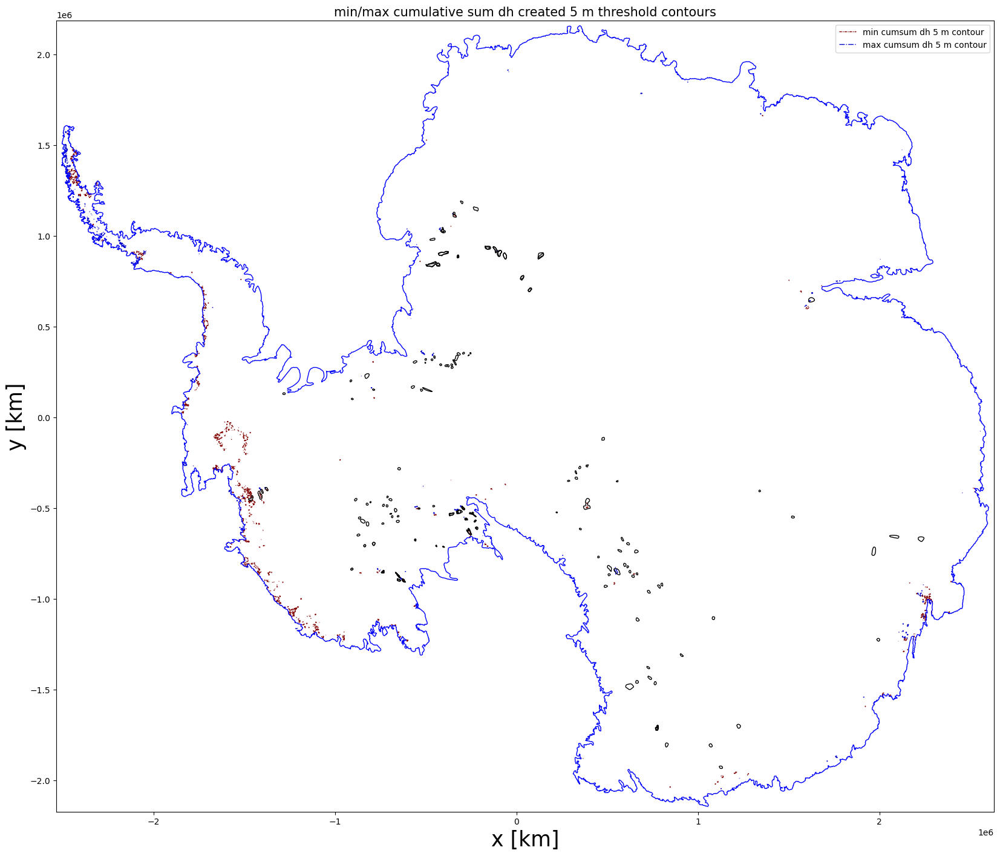

In [219]:
plot_candidates(ATL15_dh, 5, gdf_5m_subset)

In [ ]:
# later: investigate the large outlines to see if any look lake like

In [177]:
# Remove outlines with centroids within previously identified lakes

# Assuming you have two GeoDataFrames: gdf_points and gdf_polygons
gdf_points = gdf_5m_subset
gdf_polygons = SiegfriedFricker2018_outlines

# Perform a spatial join based on the centroid of gdf_points within gdf_polygons
# joined = gpd.sjoin(gdf_points, gdf_polygons, op='within')
joined = gdf_points.sjoin(gdf_polygons, how="inner", predicate='intersects')

# Extract the indices of rows in gdf_points that do not have a match in the join
rows_to_remove = joined.index

# Remove the rows from gdf_points
gdf_points_cleaned = gdf_points.drop(rows_to_remove)

In [ ]:
# rows_to_remove = joined.index_right
# doesn't work; investigate why different?

In [161]:
joined.index

Int64Index([ 48,  48, 858, 352, 950, 372, 375, 383, 394, 401, 408, 412, 413,
            418, 430, 439, 444, 963, 445, 478, 484, 550, 564, 988, 880, 902,
            920, 952, 981, 985, 986, 987],
           dtype='int64')

In [167]:
joined.index_right

48     113
48     114
858    114
352    119
950    119
372    117
375    117
383    120
394    120
401    120
408    120
412    120
413    120
418    120
430     97
439     97
444     93
963     93
445    127
478     81
484     41
550     88
564     85
988     85
880    112
902    106
920     83
952    118
981      7
985     87
986     87
987     87
Name: index_right, dtype: int64

In [166]:
len(joined.index)

32

In [165]:
len(joined.index_right)

32

In [173]:
len(gdf_points)-32

992

In [187]:
len(gdf_points)-len(joined.index_right)

992

In [186]:
len(gdf_points)

1024

In [216]:
gdf_points

,geometry,area (km^2),perim (km),min_or_max,centroid
0,"POLYGON ((1077474.445 1869067.178, 1077298.297...",0.037228,0.808470,min,POINT (1077303.916 1869050.283)
1,"POLYGON ((1357586.996 1662115.295, 1357559.827...",6.658975,10.109249,min,POINT (1355942.976 1663206.682)
2,"POLYGON ((1833541.454 1614126.453, 1833150.323...",0.067848,1.173846,min,POINT (1833253.230 1614083.909)
3,"POLYGON ((-2472214.441 1560139.005, -2472006.8...",29.932734,20.628232,min,POINT (-2474235.008 1562568.003)
4,"POLYGON ((-497193.902 1527146.676, -496393.619...",3.221123,6.772657,min,POINT (-497120.459 1528121.404)
...,...,...,...,...,...
1025,"POLYGON ((1767161.284 -1875383.871, 1766161.48...",4.928585,9.474251,max,POINT (1765938.085 -1874568.590)
1026,"POLYGON ((1713171.854 -1895209.559, 1712172.04...",5.014003,8.306186,max,POINT (1711872.122 -1894430.412)
1027,"POLYGON ((1272258.172 -1973160.886, 1272218.11...",0.015237,0.520706,max,POINT (1272281.524 -1973051.006)
1028,"POLYGON ((1229266.588 -1989054.766, 1228266.78...",0.186509,2.386170,max,POINT (1228815.073 -1988996.231)


In [184]:
gdf_points_cleaned

,geometry,area (km^2),perim (km),min_or_max,centroid
0,"POLYGON ((1077474.445 1869067.178, 1077298.297...",0.037228,0.808470,min,POINT (1077303.916 1869050.283)
1,"POLYGON ((1357586.996 1662115.295, 1357559.827...",6.658975,10.109249,min,POINT (1355942.976 1663206.682)
2,"POLYGON ((1833541.454 1614126.453, 1833150.323...",0.067848,1.173846,min,POINT (1833253.230 1614083.909)
3,"POLYGON ((-2472214.441 1560139.005, -2472006.8...",29.932734,20.628232,min,POINT (-2474235.008 1562568.003)
4,"POLYGON ((-497193.902 1527146.676, -496393.619...",3.221123,6.772657,min,POINT (-497120.459 1528121.404)
...,...,...,...,...,...
1025,"POLYGON ((1767161.284 -1875383.871, 1766161.48...",4.928585,9.474251,max,POINT (1765938.085 -1874568.590)
1026,"POLYGON ((1713171.854 -1895209.559, 1712172.04...",5.014003,8.306186,max,POINT (1711872.122 -1894430.412)
1027,"POLYGON ((1272258.172 -1973160.886, 1272218.11...",0.015237,0.520706,max,POINT (1272281.524 -1973051.006)
1028,"POLYGON ((1229266.588 -1989054.766, 1228266.78...",0.186509,2.386170,max,POINT (1228815.073 -1988996.231)


In [188]:
# appears to be not removing one of the outlines based on the counts; perhaps because 48 is repeated twice but can only be removed once
# trying to plot to see how it can be in two lakes

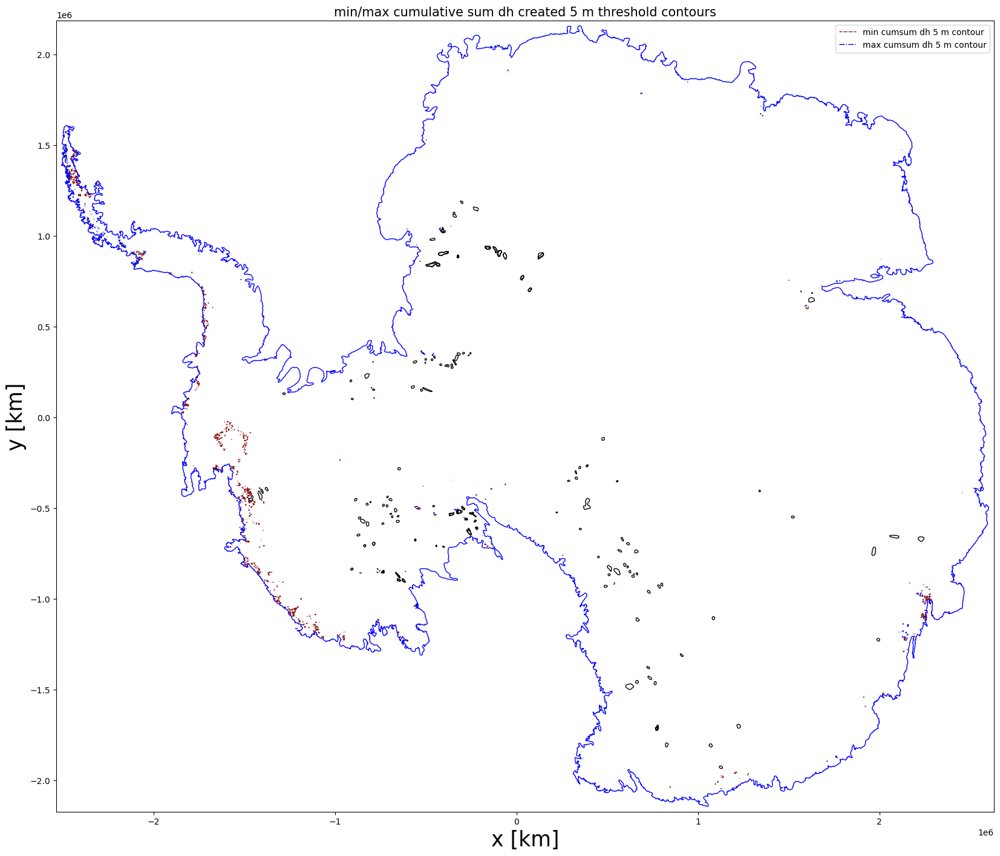

In [218]:
plot_candidates(ATL15_dh, 5, gdf_points_cleaned)

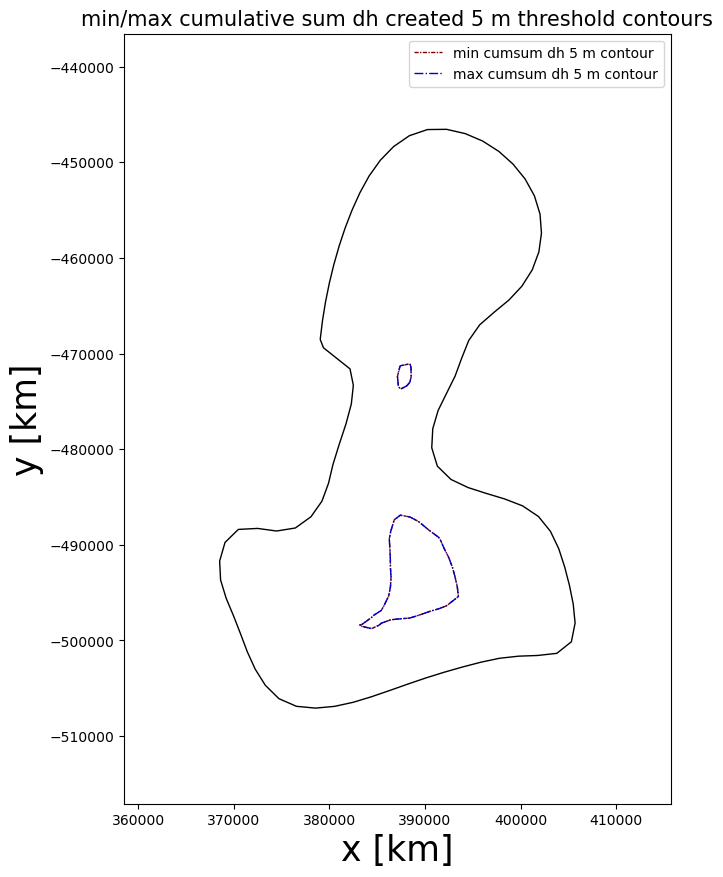

In [307]:
# investigate lake to see if outlines within previously identified lakes were removed
threshold = 5
lakename_S23 = 'Nimrod_2'
lake_gpd = Sauthoff2023_outlines.loc[Sauthoff2023_outlines['name'] == lakename_S23]
buffer = 10000
lake_buffer = lake_gpd.buffer(buffer)

# Define lake bounding box
x_min = lake_buffer.bounds.values[0,0]; x_max = lake_buffer.bounds.values[0,2]
y_min = lake_buffer.bounds.values[0,1]; y_max = lake_buffer.bounds.values[0,3]

# Visualize the max grand cumulative sums 
fig, ax = plt.subplots(figsize=(10,10))

# # Plot the outlines
# gdf_points_cleaned.boundary.plot(ax=ax, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
#         linewidth=1, label='min cumsum dh {} m contour'.format(threshold))
# gdf_points_cleaned.boundary.plot(ax=ax, color='mediumblue', linestyle='dashdot', 
#         linewidth=1, label='max cumsum dh {} m contour'.format(threshold))

# Plot the outlines
gdf_points.boundary.plot(ax=ax, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
        linewidth=1, label='min cumsum dh {} m contour'.format(threshold))
gdf_points.boundary.plot(ax=ax, color='mediumblue', linestyle='dashdot', 
        linewidth=1, label='max cumsum dh {} m contour'.format(threshold))

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

# Add legend and title
ax.legend()
ax.set_title('min/max cumulative sum dh created {} m threshold contours'.format(threshold), size=15)
plt.show()

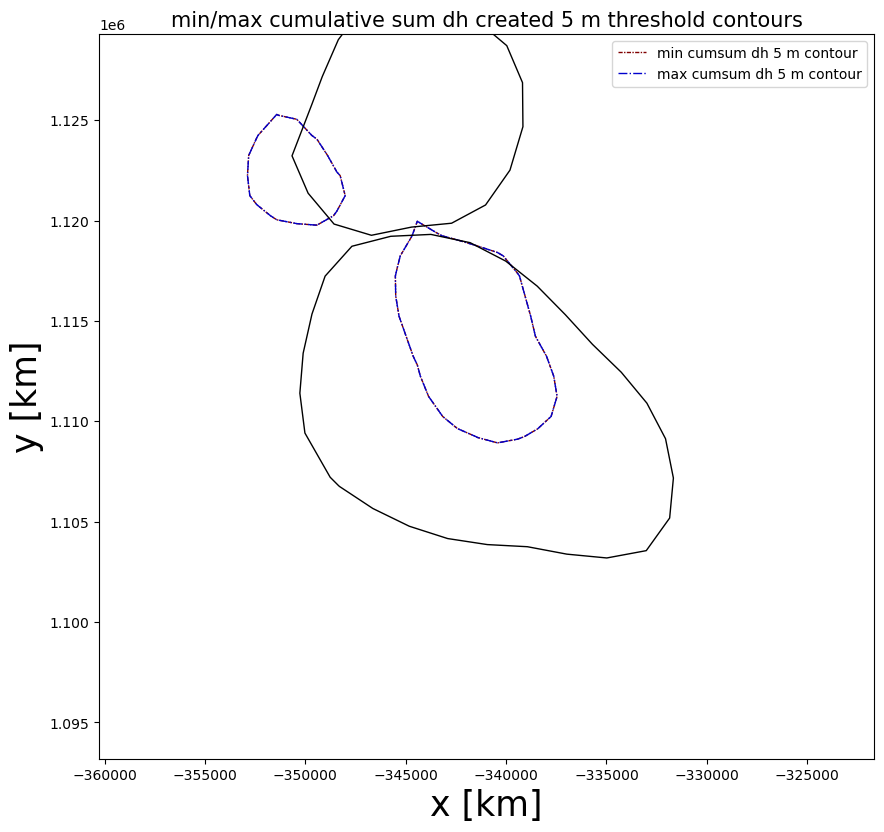

In [306]:
# investigate lake to see if outlines within previously identified lakes were removed
threshold = 5
lakename_S23 = 'Slessor_4'
lake_gpd = Sauthoff2023_outlines.loc[Sauthoff2023_outlines['name'] == lakename_S23]
buffer = 10000
lake_buffer = lake_gpd.buffer(buffer)

# Define lake bounding box
x_min = lake_buffer.bounds.values[0,0]; x_max = lake_buffer.bounds.values[0,2]
y_min = lake_buffer.bounds.values[0,1]; y_max = lake_buffer.bounds.values[0,3]

# Visualize the max grand cumulative sums 
fig, ax = plt.subplots(figsize=(10,10))

# # Plot the outlines
# gdf_points_cleaned.boundary.plot(ax=ax, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
#         linewidth=1, label='min cumsum dh {} m contour'.format(threshold))
# gdf_points_cleaned.boundary.plot(ax=ax, color='mediumblue', linestyle='dashdot', 
#         linewidth=1, label='max cumsum dh {} m contour'.format(threshold))

# Plot the outlines
gdf_points.boundary.plot(ax=ax, color='maroon', linestyle=(0, (3, 1, 1, 1)), 
        linewidth=1, label='min cumsum dh {} m contour'.format(threshold))
gdf_points.boundary.plot(ax=ax, color='mediumblue', linestyle='dashdot', 
        linewidth=1, label='max cumsum dh {} m contour'.format(threshold))

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

# Add legend and title
ax.legend()
ax.set_title('min/max cumulative sum dh created {} m threshold contours'.format(threshold), size=15)
plt.show()

In [ ]:
# finalizing algo

In [ ]:
find_cumsums(ATL15_dh)

threshold = 5
gdf = find_candidates(ATL15_dh, threshold)
print(len(gdf))
gdf_subset = gdf[gdf['area (km^2)'] <= (SiegfriedFricker2018_outlines['area (m^2)'].max()/1e6)]

In [349]:
# Remove outlines with centroids intersecting with previously identified lakes

# Assuming you have two GeoDataFrames
gdf_left = gdf_subset
gdf_left_reset = gdf_left.reset_index(drop=True)
gdf_right = SiegfriedFricker2018_outlines
gdf_right_reset = gdf_right.reset_index(drop=True)

# Perform a spatial join based on the centroid of gdf_points within gdf_polygons
# joined = gpd.sjoin(gdf_points, gdf_polygons, op='within')
joined = gdf_left_reset.sjoin(gdf_right_reset, how="inner", predicate='intersects')

# Extract the indices of rows in gdf_points that do not have a match in the join
rows_to_remove = joined.index

# Remove the rows from gdf_points
gdf_points_cleaned = gdf_left_reset.drop(rows_to_remove)

In [350]:
# Finding intersecting min/max outlines and ignore the rest?

# making max the left gdf because more outlines in that gdf
gdf_left = gdf_points_cleaned[gdf_points_cleaned['min_or_max'] == 'min']
gdf_left_reset = gdf_left.reset_index(drop=True)
gdf_right = gdf_points_cleaned[gdf_points_cleaned['min_or_max'] == 'max']
gdf_right_reset = gdf_right.reset_index(drop=True)

# Perform a spatial join based on the centroid of gdf_points within gdf_polygons
# joined = gpd.sjoin(gdf_points, gdf_polygons, op='within')
joined = gdf_left_reset.sjoin(gdf_right_reset, how="inner", predicate='intersects')

# Extract the indices of rows in gdf_points that have a match in the join
left_rows_to_keep = joined.index
right_rows_to_keep = joined.index_right.values

# Remove the rows from gdf_points
gdf_left_cleaned_minmaxintersect = gdf_left_reset.iloc[left_rows_to_keep]
gdf_right_cleaned_minmaxintersect = gdf_right_reset.iloc[right_rows_to_keep]
gdf_cleaned_minmaxintersect = pd.concat([gdf_left_cleaned_minmaxintersect, gdf_right_cleaned_minmaxintersect], ignore_index=True)

In [351]:
len(gdf_cleaned_minmaxintersect)

5010

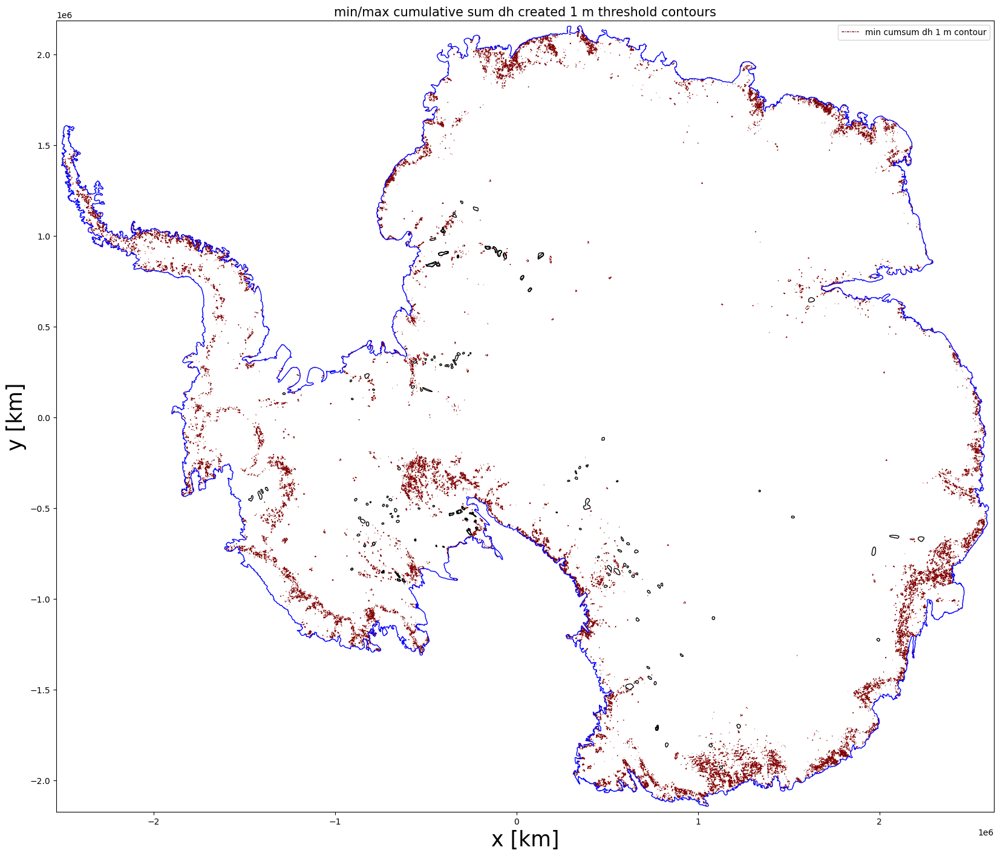

In [352]:
plot_candidates(ATL15_dh, threshold, gdf_left_reset)

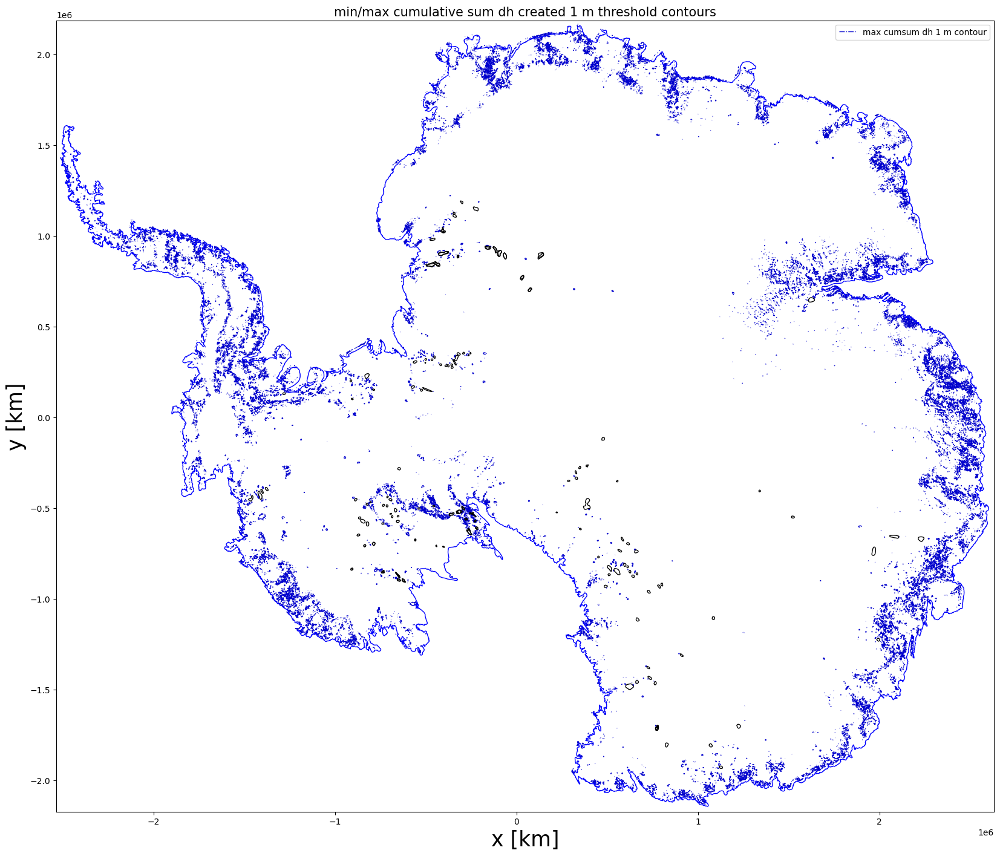

In [353]:
plot_candidates(ATL15_dh, threshold, gdf_right_reset)

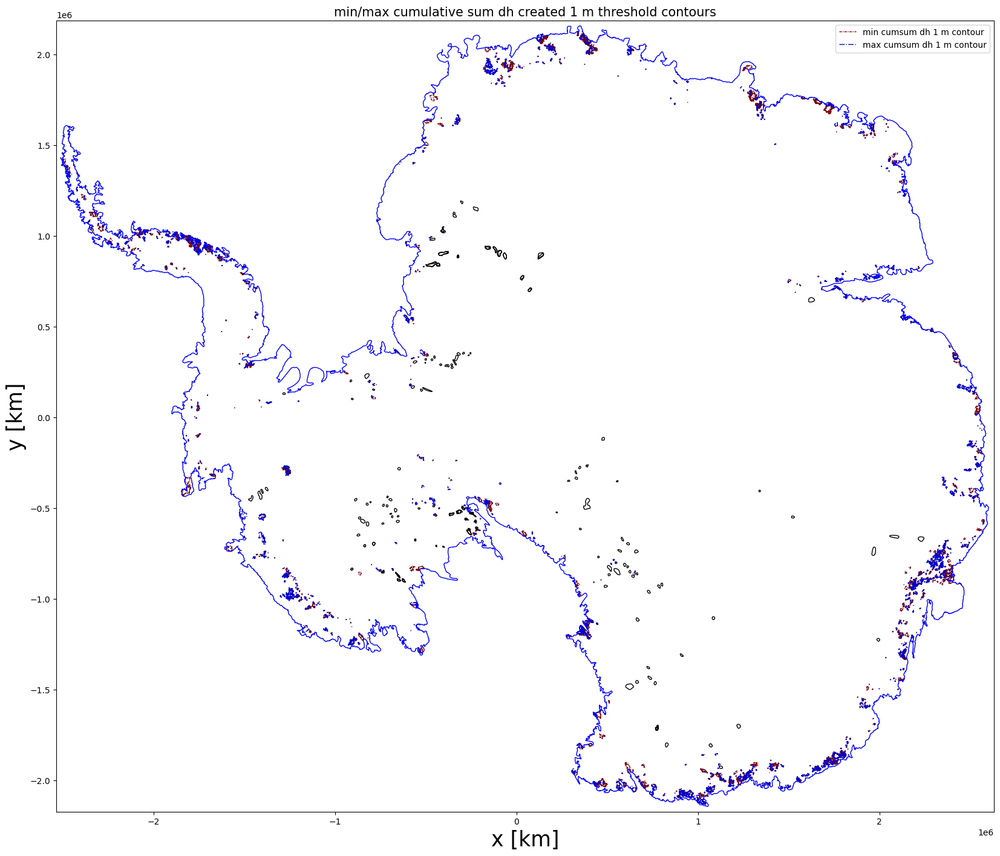

In [354]:
plot_candidates(ATL15_dh, threshold, gdf_cleaned_minmaxintersect)

In [358]:
# Perform overlay to find overlapping polygons
overlapping_polygons = gpd.overlay(gdf_left_reset, gdf_right_reset, how='intersection')

,area (km^2)_1,perim (km)_1,min_or_max_1,centroid_1,area (km^2)_2,perim (km)_2,min_or_max_2,centroid_2,geometry
0,77.274351,62.739943,min,POINT (338552.277 2116548.090),0.776680,3.947129,max,POINT (338361.539 2122877.366),"POLYGON ((338440.986 2122356.706, 337463.606 2..."
1,77.274351,62.739943,min,POINT (338552.277 2116548.090),5.395232,11.354347,max,POINT (336233.431 2119466.533),"POLYGON ((337321.395 2120008.833, 337337.654 2..."
2,77.274351,62.739943,min,POINT (338552.277 2116548.090),0.057206,1.020572,max,POINT (339396.614 2113983.435),"POLYGON ((339440.791 2113831.897, 339165.067 2..."
3,77.274351,62.739943,min,POINT (338552.277 2116548.090),0.750153,3.698132,max,POINT (339446.038 2110057.084),"POLYGON ((338782.937 2110011.158, 338754.393 2..."
4,29.002182,33.611434,min,POINT (369558.077 2113072.612),2.787822,6.299581,max,POINT (369994.784 2112531.164),"POLYGON ((369499.776 2112010.693, 369436.876 2..."
...,...,...,...,...,...,...,...,...,...
2500,0.101229,1.391759,min,POINT (1013291.692 -2096920.887),1.328425,4.653353,max,POINT (1013341.201 -2096084.704),"POLYGON ((1013310.824 -2096582.074, 1013417.26..."
2501,0.000856,0.153561,min,POINT (983325.004 -2103007.383),161.199954,60.697689,max,POINT (979574.698 -2093919.128),"POLYGON ((983292.728 -2103009.298, 983316.696 ..."
2502,6.129828,11.189682,min,POINT (1029347.598 -2105194.830),2.060011,5.554938,max,POINT (1029234.879 -2103069.104),"POLYGON ((1029307.692 -2103379.138, 1029748.81..."
2503,6.129828,11.189682,min,POINT (1029347.598 -2105194.830),33.492199,37.374299,max,POINT (1026911.527 -2108088.978),"POLYGON ((1030307.497 -2104426.708, 1030637.25..."


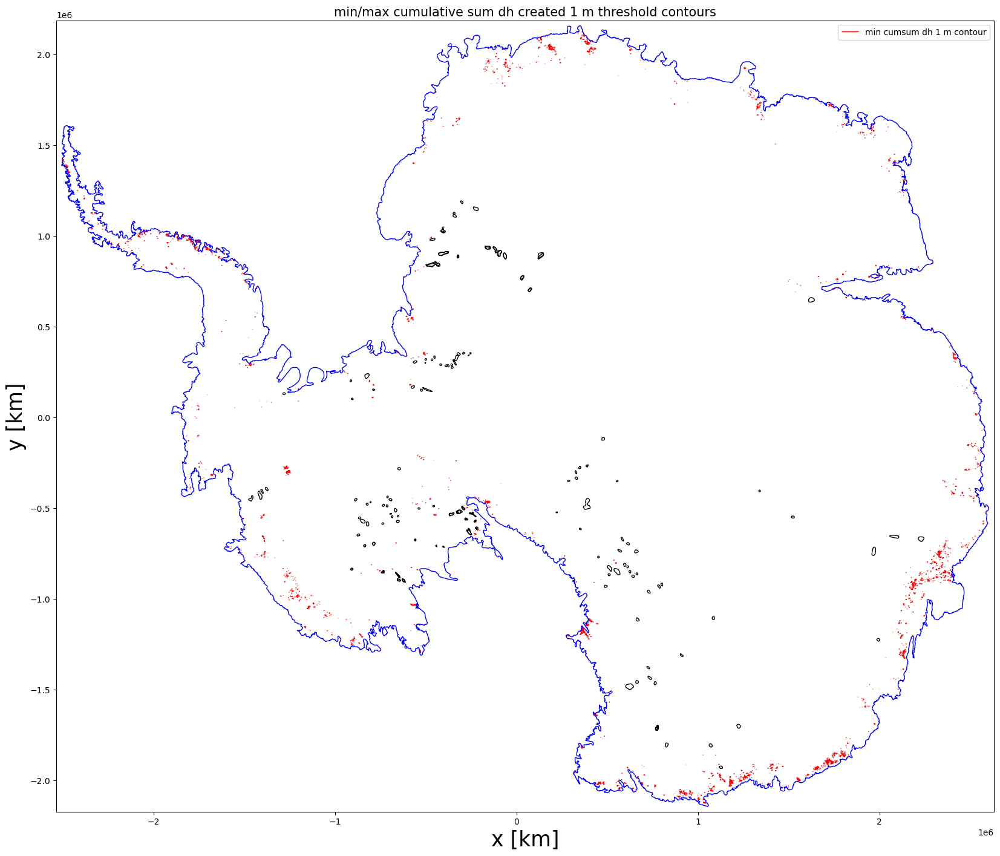

In [363]:
gdf = overlapping_polygons
dataset = ATL15_dh

# Find x, y min, max
x_min, x_max = (dataset['x'].min().values, dataset['x'].max().values)
y_min, y_max = (dataset['y'].min().values, dataset['y'].max().values)

# Visualize the max grand cumulative sums 
fig, ax = plt.subplots(figsize=(20,20))

# Plot the outlines
gdf.boundary.plot(ax=ax, color='red', linestyle='solid', 
        linewidth=1, label='min cumsum dh {} m contour'.format(threshold))

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# Label axes set limits
ax.set_xlabel('x [km]', size=25)
ax.set_ylabel('y [km]', size=25)
x_min, x_max = (dataset['x'].min().values-30e3, dataset['x'].max().values+30e3)
y_min, y_max = (dataset['y'].min().values-30e3, dataset['y'].max().values+30e3)
ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

# Add legend and title
ax.legend()
ax.set_title('min/max cumulative sum dh created {} m threshold contours'.format(threshold), size=15)
plt.show()

In [ ]:
# finalizing algo with for loop to capture multiple height thresholds

In [35]:
find_cumsums(ATL15_dh)

# thresholds = [10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0.75, 0.5]#, 0.25]
thresholds = [1, 0.75, 0.5]

# Assuming you have an existing GeoDataFrame
gdf_concatenated = gpd.GeoDataFrame(columns=['geometry', 'area (km^2)', 'perim (km)', 'min_or_max', 'centroid'])

for i in thresholds: 
    gdf = find_candidates(ATL15_dh, i)
    print('Working on', i, ' m threshold')
    # Append the new GeoDataFrame to the existing one
    gdf_concatenated = gdf_concatenated.append(gdf, ignore_index=True)

Working on 1  m threshold
Working on 0.75  m threshold
Working on 0.5  m threshold


In [36]:
gdf_subset = gdf_concatenated[gdf_concatenated['area (km^2)'] <= (SiegfriedFricker2018_outlines['area (m^2)'].max()/1e6)]

# Assign metadata
gdf_subset.metadata = {
    'name': 'gdf_subset',
}

In [37]:
ROI = 'Antarctica'

plot_candidates(ROI, ATL15_dh, thresholds, gdf_subset)

In [38]:
# Remove outlines with centroids intersecting with previously identified lakes

# Assuming you have two GeoDataFrames
gdf_left = gdf_subset
gdf_left_reset = gdf_left.reset_index(drop=True)
gdf_right = SiegfriedFricker2018_outlines
gdf_right_reset = gdf_right.reset_index(drop=True)

# Perform a spatial join based on the centroid of gdf_points within gdf_polygons
# joined = gpd.sjoin(gdf_points, gdf_polygons, op='within')
joined = gdf_left_reset.sjoin(gdf_right_reset, how="inner", predicate='intersects')

# Extract the indices of rows in gdf_points that do not have a match in the join
rows_to_remove = joined.index

# Remove the rows from gdf_points
gdf_cleaned = gdf_left_reset.drop(rows_to_remove)

# Assign metadata
gdf_cleaned.metadata = {
    'name': 'gdf_cleaned',
}

In [39]:
plot_candidates(ROI, ATL15_dh, thresholds, gdf_cleaned)

In [40]:
# Finding intersecting min/max outlines and ignore the rest?

# making max the left gdf because more outlines in that gdf
gdf_min = gdf_cleaned[gdf_cleaned['min_or_max'] == 'min']
gdf_min_reset = gdf_min.reset_index(drop=True)
gdf_max = gdf_cleaned[gdf_cleaned['min_or_max'] == 'max']
gdf_max_reset = gdf_max.reset_index(drop=True)

# Perform a spatial join based on the centroid of gdf_points within gdf_polygons
# joined = gpd.sjoin(gdf_points, gdf_polygons, op='within')
joined = gdf_min_reset.sjoin(gdf_max_reset, how="inner", predicate='intersects')

# Extract the indices of rows in gdf_points that have a match in the join
min_rows_to_keep = joined.index
max_rows_to_keep = joined.index_right.values

# Remove the rows from gdf_points
gdf_min_maxintersect = gdf_min_reset.iloc[min_rows_to_keep]
gdf_max_minintersect = gdf_max_reset.iloc[max_rows_to_keep]
gdf_minmaxintersect = pd.concat([gdf_min_maxintersect, gdf_max_minintersect], ignore_index=True)

# Assign metadata
gdf_minmaxintersect.metadata = {
    'name': 'gdf_minmaxintersect',
}

In [41]:
# plot_candidates(ROI, ATL15_dh, thresholds, gdf_min_maxintersect)

In [42]:
# plot_candidates(ROI, ATL15_dh, thresholds, gdf_max_minintersect)

In [43]:
plot_candidates(ROI, ATL15_dh, thresholds, gdf_minmaxintersect)

In [44]:
# Perform overlay to find overlapping polygons
gdf_intersection = gpd.overlay(gdf_min_maxintersect, gdf_max_minintersect, how='intersection')

# Assign metadata
gdf_intersection.metadata = {
    'name': 'gdf_intersection',
}

In [45]:
plot_candidates(ROI, ATL15_dh, thresholds, gdf_intersection)

In [ ]:
# gdf = gdf_intersection
# dataset = ATL15_dh

# # Find x, y min, max
# x_min, x_max = (dataset['x'].min().values, dataset['x'].max().values)
# y_min, y_max = (dataset['y'].min().values, dataset['y'].max().values)

# # Visualize the max grand cumulative sums 
# fig, ax = plt.subplots(figsize=(20,20))

# # Plot the outlines
# gdf.boundary.plot(ax=ax, color='magenta', linestyle='solid', 
#         linewidth=1, label='lake candidates')

# # Overlay published active lake outlines for visual comparison and grounding line
# Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
# SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
# Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
# Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

# # Label axes set limits
# ax.set_xlabel('x [km]', size=25)
# ax.set_ylabel('y [km]', size=25)
# x_min, x_max = (dataset['x'].min().values-30e3, dataset['x'].max().values+30e3)
# y_min, y_max = (dataset['y'].min().values-30e3, dataset['y'].max().values+30e3)
# ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

# # Add legend and title
# ax.legend()
# ax.set_title('lake candidates created from spatially coherent min/max cumulative sum dh\nusing iterative {} m dh contours'.format(threshold), size=15)
# plt.show()

## Other ideas: 
* find dh range by differencing the max and min dh cumsum
* or using absolute heights at each cycle and finding the max and min absolute height, then differencing (i don't think this would work for high accumulation or ablation regions where the range would high)
* further filter signal by looking at 3 or 4 pi (more than one osscilation)
* filter to make sure it goes uplift, lowering, uplift, lowering sequentially (are there any lakes that have lowering repeated by lowering?)
* filter by seasonality? perhaps simplify to winter/summer seasons
* everything in a basin/region has min and max at same time? are they synchrous or sequential or random (latter two would be water driven)
* filter for a min area of lake (because perhaps we don't care about really small lakes because not large vol percentage of system?)
* don't go as low in height threshold for similar reasoning of not caring about smaller signals

# Trying to plot interactively with folium

In [10]:
# using geopandas example of polygon plotting with folium
# https://geopandas.org/en/stable/gallery/polygon_plotting_with_folium.html
df = SiegfriedFricker2018_outlines
df.head()

,name,geometry,area (m^2),perimeter (m),cite
0,Bindschadler_1,"POLYGON ((-792264.327 -691480.857, -791281.458...",1.943146e+08,51147.562479,"Smith and others, 2009, J. Glac., doi:10.3189/..."
1,Bindschadler_2,"POLYGON ((-842788.063 -708464.240, -842354.948...",1.072249e+08,37249.152584,"Smith and others, 2009, J. Glac., doi:10.3189/..."
2,Bindschadler_3,"POLYGON ((-874893.221 -654533.044, -876415.673...",1.404559e+08,44183.483257,"Smith and others, 2009, J. Glac., doi:10.3189/..."
3,Bindschadler_4,"POLYGON ((-828821.778 -584874.415, -828822.032...",2.816411e+08,62680.016773,"Smith and others, 2009, J. Glac., doi:10.3189/..."
4,Bindschadler_5,"POLYGON ((-858067.460 -573467.564, -858714.391...",3.923966e+08,73686.203194,"Smith and others, 2009, J. Glac., doi:10.3189/..."


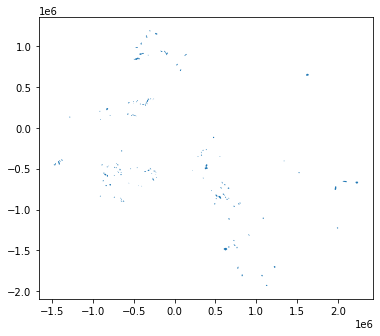

In [11]:
df.plot(figsize=(6, 6))
plt.show()

In [20]:
# clip ATL15 to some buffer inland of grounding line
Scripps_landice_buffer = Scripps_landice.geometry.buffer(-10000)

<AxesSubplot:>

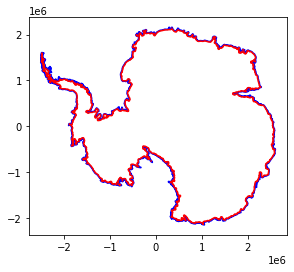

In [21]:
fig, ax = plt.subplots()
Scripps_landice.geometry.boundary.plot(ax=ax, ec='blue')
Scripps_landice_buffer.geometry.boundary.plot(ax=ax, ec='red')

In [22]:
# clip ATL15_dh to grounding line (first set crs)
#ATL15_dh.rio.write_crs(3031, inplace=True)
ATL15_dh_clipped = ATL15_dh.rio.clip(Scripps_landice.geometry.values, Scripps_landice.crs, drop=False)

In [23]:
# view crs
df.crs

<Derived Projected CRS: EPSG:3031>
Name: WGS 84 / Antarctic Polar Stereographic
Axis Info [cartesian]:
- E[north]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Antarctica.
- bounds: (-180.0, -90.0, 180.0, -60.0)
Coordinate Operation:
- name: Antarctic Polar Stereographic
- method: Polar Stereographic (variant B)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [24]:
# Use WGS 84 (epsg:4326) as the geographic coordinate system
# because folium require coords in lon, lat
df = df.to_crs(epsg=4326)
print(df.crs)
df.head()

epsg:4326


,name,geometry,area (m^2),perimeter (m),cite
0,Bindschadler_1,"POLYGON ((-131.11415 -80.34358, -131.10497 -80...",1.943146e+08,51147.562479,"Smith and others, 2009, J. Glac., doi:10.3189/..."
1,Bindschadler_2,"POLYGON ((-130.05107 -79.89196, -129.96836 -79...",1.072249e+08,37249.152584,"Smith and others, 2009, J. Glac., doi:10.3189/..."
2,Bindschadler_3,"POLYGON ((-126.80123 -79.96843, -126.72681 -79...",1.404559e+08,44183.483257,"Smith and others, 2009, J. Glac., doi:10.3189/..."
3,Bindschadler_4,"POLYGON ((-125.20946 -80.68349, -125.11976 -80...",2.816411e+08,62680.016773,"Smith and others, 2009, J. Glac., doi:10.3189/..."
4,Bindschadler_5,"POLYGON ((-123.75578 -80.52208, -123.64847 -80...",3.923966e+08,73686.203194,"Smith and others, 2009, J. Glac., doi:10.3189/..."


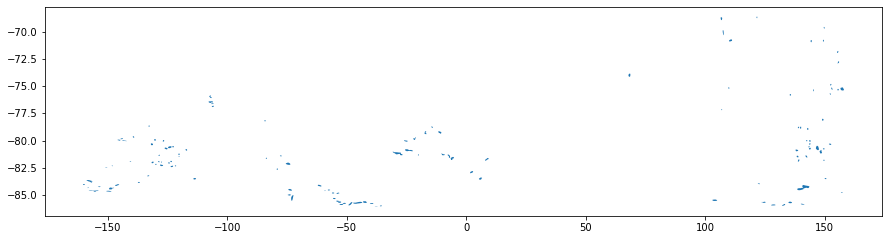

In [25]:
# plot polygons in new crs coords
df.plot(figsize=(15, 15))
plt.show()

In [26]:
m = folium.Map(location=[-77.5, 0], zoom_start=5, crs='EPSG3857', tiles='Stamen Terrain') # [lat, lon]
m

In [27]:
for _, r in df.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'b'})
    folium.Popup(r['name']).add_to(geo_j)
    geo_j.add_to(m)
m

In [28]:
# add centroid markers
# Project to 3031 projected crs
df = df.to_crs(epsg=3031)

# Access the centroid attribute of each polygon
df['centroid'] = df.centroid

# project to WGS84 geographic crs
# geometry (active) column
df = df.to_crs(epsg=4326)

# Centroid column
df['centroid'] = df['centroid'].to_crs(epsg=4326)

In [29]:
for _, r in df.iterrows():
    lat = r['centroid'].y
    lon = r['centroid'].x
    folium.Marker(location=[lat, lon],
                  popup='name: {} <br> cite: {} <br> area (km^2): {} <br> perimeter (km): {}'.format(r['name'], r['cite'], r['area (m^2)']*1e-6, r['perimeter (m)']*1e-3)).add_to(m)

m

In [ ]:
# overlay variable outlines during ICESat-2 era using folium's ImageOverlay function

In [30]:
# Folium appears to not have polar projection, so trying GeoViews
import geoviews as gv
import geoviews.feature as gf
import xarray as xr
from cartopy import crs

gv.extension('bokeh', 'matplotlib')

ModuleNotFoundError: No module named 'geoviews'

In [50]:
gv.Polygons(SiegfriedFricker2018_outlines)
#   , vdims=['pop_est', ('name', 'Country')]).opts(
#     tools=['hover'], width=600, projection=crs.Robinson()
# )

/srv/conda/envs/notebook/lib/python3.10/site-packages/geoviews/operation/projection.py:99: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if proj_geom.geom_type == 'GeometryCollection' and len(proj_geom) == 0:
/srv/conda/envs/notebook/lib/python3.10/site-packages/geoviews/operation/projection.py:79: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  polys = [g for g in geom if g.area > 1e-15]


:Polygons   [Longitude,Latitude]   (name,area (m^2),perimeter (m),cite)

In [51]:
gv.Polygons(gpd.read_file(gpd.datasets.get_path('naturalearth_lowres')), vdims=['pop_est', ('name', 'Country')]).opts(
    tools=['hover'], width=600, projection=crs.SouthPolarStereo()
)

/srv/conda/envs/notebook/lib/python3.10/site-packages/geoviews/operation/projection.py:79: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  polys = [g for g in geom if g.area > 1e-15]
/srv/conda/envs/notebook/lib/python3.10/site-packages/geoviews/operation/projection.py:99: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if proj_geom.geom_type == 'GeometryCollection' and len(proj_geom) == 0:


:Polygons   [Longitude,Latitude]   (pop_est,name)

In [31]:
pd.read_parquet(DATA_DIR + 'altimetry/icesat/icesat_trackmap.parquet')

ImportError: Unable to find a usable engine; tried using: 'pyarrow', 'fastparquet'.
A suitable version of pyarrow or fastparquet is required for parquet support.
Trying to import the above resulted in these errors:
 - Missing optional dependency 'pyarrow'. pyarrow is required for parquet support. Use pip or conda to install pyarrow.
 - Missing optional dependency 'fastparquet'. fastparquet is required for parquet support. Use pip or conda to install fastparquet.

In [ ]:
# Display all rows of the GeoPandas DataFrame
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(gdf_right_reset)

                                              geometry   area (km^2)  \
0    POLYGON ((610387.747 2054872.604, 610160.594 2...  2.297513e-01   
1    POLYGON ((1296253.474 1950938.113, 1295253.670...  2.729076e+01   
2    POLYGON ((-47483.461 1911986.766, -48483.265 1...  1.377498e+01   
3    POLYGON ((-40484.831 1907014.804, -41484.635 1...  4.158921e+00   
4    POLYGON ((-36485.614 1904687.746, -37485.418 1...  5.016772e+00   
5    POLYGON ((-42484.439 1904793.110, -43037.486 1...  2.223899e-01   
6    POLYGON ((-43484.243 1903122.512, -44232.288 1...  1.485900e+00   
7    POLYGON ((-44484.048 1902956.344, -44560.551 1...  9.552036e-02   
8    POLYGON ((-35485.809 1901965.248, -35947.619 1...  1.442633e+00   
9    POLYGON ((1297253.279 1868893.984, 1297026.107...  4.998300e-02   
10   POLYGON ((1018307.888 1867571.805, 1017308.084...  1.366859e+00   
11   POLYGON ((1295253.670 1866814.052, 1294962.305...  1.977946e-01   
12   POLYGON ((1288255.040 1853511.350, 1287837.615...  6.011808